In [ ]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
import pandas as pd
import yfinance as yf
import os
from google.colab import files

# Manually Upload CSV Instead of Using Kaggle
print("Upload your CSV file containing company data:")
uploaded = files.upload()

# Get the uploaded file name
csv_filename = list(uploaded.keys())[0]
print(f"Uploaded file: {csv_filename}")

def load_company_data(filepath):
    df = pd.read_csv(filepath)

    if 'Symbol' not in df.columns or 'Industry' not in df.columns:
        raise ValueError("CSV file must contain 'Symbol' and 'Industry' columns.")

    label_encoder = LabelEncoder()
    df['Industry Encoded'] = label_encoder.fit_transform(df['Industry'])
    return df['Symbol'].tolist(), df['Industry'].tolist(), df['Industry Encoded'].tolist()

def fetch_stock_data(ticker, start_date, end_date):
    try:
        data = yf.download(f"{ticker}.NS", start=start_date, end=end_date)
        return data if not data.empty else None
    except Exception as e:
        print(f"Error fetching data for {ticker}: {e}")
        return None

def compute_features(stock_data):
    numeric_cols = ['Open', 'High', 'Low', 'Close']
    stock_data[numeric_cols] = stock_data[numeric_cols].astype(float)

    for window in [5, 10, 15, 20, 25, 30]:
        stock_data[f'MA_{window}'] = stock_data['Close'].rolling(window=window).mean()

    scaler = StandardScaler()
    stock_data['Normalised Close'] = scaler.fit_transform(stock_data[['Close']])

    stock_data['Return Ratio'] = (stock_data['Close'] - stock_data['Close'].shift(1)) / stock_data['Close'].shift(1)
    stock_data['Percentage Change Open'] = stock_data['Open'] / stock_data['Close'] - 1
    stock_data['Percentage Change High'] = stock_data['High'] / stock_data['Close'] - 1
    stock_data['Percentage Change Low'] = stock_data['Low'] / stock_data['Close'] - 1

    return stock_data

def align_with_reference(stock_data, reference_dates):
    start_ref, end_ref = reference_dates
    stock_dates = stock_data.index

    if stock_dates.min() > start_ref or stock_dates.max() < end_ref:
        return False
    return True

def main():
    start_date, end_date = "2022-01-10", "2025-01-10"
    companies, sector, sector_encoded = load_company_data(csv_filename)
    os.makedirs('Data_is_here', exist_ok=True)

    reference_data = fetch_stock_data("ONGC", start_date, end_date)
    if reference_data is None:
        print("Failed to fetch reference data.")
        return
    reference_dates = (reference_data.index.min(), reference_data.index.max())

    missing = []
    for ticker in companies:
        stock_data = fetch_stock_data(ticker, start_date, end_date)
        if stock_data is not None:
            if not align_with_reference(stock_data, reference_dates):
                print(f"Skipping {ticker} due to insufficient data.")
                missing.append(ticker)
                continue

            stock_data = compute_features(stock_data)

            idx = companies.index(ticker) if ticker in companies else -1
            if idx != -1:
                stock_data['Sector'] = sector[idx]
                stock_data['Sector Encoded'] = sector_encoded[idx]

            stock_data.to_csv(f'Data_is_here/{ticker}_data.csv')
            print(f"Processed and saved data for {ticker}.")
        else:
            print(f"Skipping {ticker} due to missing data.")
            missing.append(ticker)

    with open("Data_is_here/skipped_stocks.txt", "w") as file:
        for line in missing:
            file.write(line + "\n")

    print("All data processing completed.")

if __name__ == "__main__":
    main()



Upload your CSV file containing company data:


Saving ind_nifty500list_filtered_final.csv to ind_nifty500list_filtered_final.csv
Uploaded file: ind_nifty500list_filtered_final.csv
YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for 360ONE.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for ABB.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for ACC.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for AIAENG.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for APLAPOLLO.


Processed and saved data for AUBANK.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for AARTIIND.


Processed and saved data for AAVAS.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for ABBOTINDIA.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for ACE.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for ADANIENT.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for ADANIGREEN.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ADANIPORTS.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ADANIPOWER.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ATGL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ABCAPITAL.


Processed and saved data for ABFRL.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for ABSLAMC.


Processed and saved data for AFFLE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for AJANTPHARM.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for APLLTD.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ALKEM.


Processed and saved data for ALKYLAMINE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for ALOKINDS.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for AMBER.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for AMBUJACEM.


Processed and saved data for ANANDRATHI.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for ANANTRAJ.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for ANGELONE.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for APARINDS.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for APOLLOHOSP.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for APOLLOTYRE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for APTUS.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ASAHIINDIA.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ASHOKLEY.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for ASIANPAINT.
Processed and saved data for ASTERDM.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for ASTRAZEN.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ASTRAL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ATUL.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for AUROPHARMA.
Processed and saved data for AVANTIFEED.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for DMART.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for AXISBANK.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for BASF.
Processed and saved data for BEML.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for BLS.
Processed and saved data for BSE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for BAJAJ-AUTO.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for BAJFINANCE.
Processed and saved data for BAJAJFINSV.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for BAJAJHLDNG.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for BALAMINES.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for BALKRISIND.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for BALRAMCHIN.
Processed and saved data for BANDHANBNK.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for BANKBARODA.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for BANKINDIA.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for MAHABANK.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for BATAINDIA.
Processed and saved data for BAYERCROP.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for BERGEPAINT.
Processed and saved data for BDL.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for BEL.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for BHARATFORG.
Processed and saved data for BHEL.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for BPCL.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for BHARTIARTL.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for BIOCON.
Processed and saved data for BIRLACORPN.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for BSOFT.


Processed and saved data for BLUEDART.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for BLUESTARCO.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for BBTC.
Processed and saved data for BOSCHLTD.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for BRITANNIA.
Processed and saved data for MAPMYINDIA.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for CCL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for CESC.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for CGPOWER.


Processed and saved data for CIEINDIA.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for CRISIL.


Processed and saved data for CANFINHOME.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for CANBK.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for CAPLIPOINT.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for CGCL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for CARBORUNIV.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for CASTROLIND.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for CEATLTD.
Processed and saved data for CENTRALBK.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for CDSL.
Processed and saved data for CENTURYPLY.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for CERA.
Processed and saved data for CHALET.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for CHAMBLFERT.
Processed and saved data for CHEMPLASTS.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for CHENNPETRO.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for CHOLAHLDNG.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for CHOLAFIN.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for CIPLA.
Processed and saved data for CUB.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for CLEAN.
Processed and saved data for COALINDIA.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for COCHINSHIP.
Processed and saved data for COFORGE.



[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for COLPAL.
Processed and saved data for CAMS.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for CONCOR.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for COROMANDEL.
Processed and saved data for CRAFTSMAN.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for CREDITACC.
Processed and saved data for CROMPTON.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for CUMMINSIND.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for CYIENT.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for DLF.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for DABUR.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for DALBHARAT.
Processed and saved data for DATAPATTNS.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for DEEPAKFERT.
Processed and saved data for DEEPAKNTR.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for DEVYANI.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for DIVISLAB.
Processed and saved data for DIXON.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for LALPATHLAB.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for DRREDDY.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for EIDPARRY.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for EIHOTEL.
Processed and saved data for EASEMYTRIP.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for EICHERMOT.
Processed and saved data for ELECON.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for ELGIEQUIP.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for EMAMILTD.
Processed and saved data for ENDURANCE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for ENGINERSIN.
Processed and saved data for EQUITASBNK.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for ERIS.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for ESCORTS.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for EXIDEIND.


Processed and saved data for NYKAA.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for FEDERALBNK.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for FACT.


Processed and saved data for FINEORG.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for FINCABLES.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for FINPIPE.
Processed and saved data for FSL.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for FORTIS.
Processed and saved data for GRINFRA.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for GAIL.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for GVT&D.
Processed and saved data for GMRAIRPORT.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for GRSE.
Processed and saved data for GICRE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for GILLETTE.
Processed and saved data for GLAND.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for GLAXO.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for GLENMARK.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for GPIL.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for GODFRYPHLP.
Processed and saved data for GODREJAGRO.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for GODREJCP.
Processed and saved data for GODREJPROP.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for GRANULES.
Processed and saved data for GRAPHITE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for GRASIM.
Processed and saved data for GESHIP.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for GRINDWELL.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for GAEL.
Processed and saved data for FLUOROCHEM.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for GUJGASLTD.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for GMDCLTD.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for GNFC.
Processed and saved data for GPPL.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for GSFC.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for GSPL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for HEG.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for HCLTECH.
Processed and saved data for HDFCAMC.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for HDFCBANK.
Processed and saved data for HDFCLIFE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for HFCL.
Processed and saved data for HAPPSTMNDS.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for HAVELLS.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for HEROMOTOCO.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for HSCL.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for HINDALCO.
Processed and saved data for HAL.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for HINDCOPPER.


Processed and saved data for HINDPETRO.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for HINDUNILVR.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for HINDZINC.
Processed and saved data for POWERINDIA.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for HOMEFIRST.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for HONAUT.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for HUDCO.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ICICIBANK.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ICICIGI.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ICICIPRULI.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for ISEC.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for IDBI.
Processed and saved data for IDFCFIRSTB.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for IFCI.
Processed and saved data for IIFL.



[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for IRB.
Processed and saved data for IRCON.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for ITC.
Processed and saved data for ITI.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for INDIACEM.
Processed and saved data for INDIAMART.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for INDIANB.
Processed and saved data for IEX.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for INDHOTEL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for IOC.
Processed and saved data for IOB.



[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for IRCTC.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for IRFC.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for IGL.
Processed and saved data for INDUSTOWER.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for INDUSINDBK.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for NAUKRI.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for INFY.
Processed and saved data for INOXWIND.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for INTELLECT.
Processed and saved data for INDIGO.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for IPCALAB.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for JBCHEPHARM.
Processed and saved data for JKCEMENT.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for JBMA.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for JKLAKSHMI.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for JKTYRE.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for JMFINANCIL.
Processed and saved data for JSWENERGY.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for JSWSTEEL.
Processed and saved data for JPPOWER.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for J&KBANK.


Processed and saved data for JINDALSAW.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for JSL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for JINDALSTEL.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for JUBLFOOD.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for JUBLINGREA.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for JUBLPHARMA.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for JWL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for JUSTDIAL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for JYOTHYLAB.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for KPRMILL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for KEI.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for KNRCON.
Processed and saved data for KPITTECH.



[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for KSB.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for KAJARIACER.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for KALYANKJIL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for KANSAINER.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for KARURVYSYA.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for KEC.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for KIRLOSBROS.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for KIRLOSENG.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for KOTAKBANK.
Processed and saved data for KIMS.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for LTF.
Processed and saved data for LTTS.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for LICHSGFIN.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for LTIM.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for LT.
Processed and saved data for LATENTVIEW.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for LAURUSLABS.
Processed and saved data for LEMONTREE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for LINDEINDIA.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for LUPIN.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for MMTC.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for MRF.
Processed and saved data for LODHA.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for MGL.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for MAHSEAMLES.
Processed and saved data for M&MFIN.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for M&M.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for MAHLIFE.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for MANAPPURAM.
Processed and saved data for MRPL.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for MARICO.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for MARUTI.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for MASTEK.
Processed and saved data for MFSL.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for MAXHEALTH.
Processed and saved data for MAZDOCK.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for METROBRAND.
Processed and saved data for METROPOLIS.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for MINDACORP.
Processed and saved data for MOTILALOFS.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for MPHASIS.
Processed and saved data for MCX.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for MUTHOOTFIN.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for NATCOPHARM.
Processed and saved data for NBCC.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for NCC.
Processed and saved data for NHPC.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for NLCINDIA.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for NMDC.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for NTPC.
Processed and saved data for NH.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for NATIONALUM.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for NAVINFLUOR.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for NESTLEIND.
Processed and saved data for NETWORK18.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for NEWGEN.
Processed and saved data for NAM-INDIA.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for NUVOCO.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for OBEROIRLTY.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for ONGC.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for OIL.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for OLECTRA.
Processed and saved data for PAYTM.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for OFSS.
Processed and saved data for POLICYBZR.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for PCBL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for PIIND.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for PNBHOUSING.
Processed and saved data for PNCINFRA.



[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for PAGEIND.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for PATANJALI.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for PERSISTENT.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for PETRONET.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for PFIZER.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for PIDILITIND.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for PEL.
Processed and saved data for POLYMED.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for POLYCAB.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for POONAWALLA.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for PFC.
Processed and saved data for POWERGRID.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for PRAJIND.
Processed and saved data for PRESTIGE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for PGHH.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for PNB.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for QUESS.
Processed and saved data for RBLBANK.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for RECLTD.
Processed and saved data for RHIM.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for RITES.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for RADICO.
Processed and saved data for RVNL.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for RAILTEL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for RAJESHEXPO.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for RKFORGE.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for RCF.
Processed and saved data for RATNAMANI.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for RTNINDIA.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for RAYMOND.
Processed and saved data for REDINGTON.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for RELIANCE.
Processed and saved data for ROUTE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for SBICARD.
Processed and saved data for SBILIFE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for SJVN.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for SKFINDIA.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for SRF.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for SAMMAANCAP.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for MOTHERSON.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for SANOFI.
Processed and saved data for SAPPHIRE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for SAREGAMA.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for SCHAEFFLER.
Processed and saved data for SCHNEIDER.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for SCI.
Processed and saved data for SHREECEM.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for RENUKA.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for SHRIRAMFIN.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for SHYAMMETL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for SIEMENS.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for SOBHA.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for SOLARINDS.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for SONACOMS.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for SONATSOFTW.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for STARHEALTH.


Processed and saved data for SBIN.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for SAIL.
Processed and saved data for SWSOLAR.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for SUMICHEM.
Processed and saved data for SPARC.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for SUNPHARMA.
Processed and saved data for SUNTV.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for SUNDARMFIN.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for SUNDRMFAST.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for SUPREMEIND.
Processed and saved data for SUVENPHAR.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for SUZLON.
Processed and saved data for SYNGENE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for TVSMOTOR.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for TANLA.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for TATACHEM.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for TATACOMM.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for TCS.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for TATACONSUM.
Processed and saved data for TATAELXSI.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for TATAINVEST.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for TATAMOTORS.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for TATAPOWER.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for TATASTEEL.
Processed and saved data for TTML.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for TECHM.
Processed and saved data for TECHNOE.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for TEJASNET.
Processed and saved data for NIACL.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for RAMCOCEM.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for THERMAX.
Processed and saved data for TIMKEN.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for TITAGARH.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for TITAN.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for TORNTPHARM.
Processed and saved data for TORNTPOWER.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for TRENT.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for TRIDENT.
Processed and saved data for TRIVENI.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for TRITURBINE.
Processed and saved data for TIINDIA.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for UCOBANK.
Processed and saved data for UNOMINDA.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for UPL.
Processed and saved data for UTIAMC.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for UJJIVANSFB.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for ULTRACEMCO.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for UNIONBANK.


[*********************100%***********************]  1 of 1 completed

Processed and saved data for UBL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for USHAMART.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for VGUARD.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for VIPIND.
Processed and saved data for DBREALTY.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for VTL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for VARROC.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for VBL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for VEDL.



[*********************100%***********************]  1 of 1 completed

Processed and saved data for VIJAYA.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for VINATIORGA.
Processed and saved data for IDEA.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for VOLTAS.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for WELCORP.
Processed and saved data for WELSPUNLIV.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for WESTLIFE.
Processed and saved data for WHIRLPOOL.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Processed and saved data for WIPRO.
Processed and saved data for YESBANK.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for ZFCVINDIA.



[*********************100%***********************]  1 of 1 completed


Processed and saved data for ZEEL.


[*********************100%***********************]  1 of 1 completed


Processed and saved data for ZENSARTECH.
Processed and saved data for ZOMATO.


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Processed and saved data for ZYDUSLIFE.
Processed and saved data for ECLERX.
All data processing completed.


In [ ]:
import os
import pandas as pd

file_path = "/content/Data_is_here"

# Ensure the directory exists
if not os.path.exists(file_path):
    print("Error: Directory does not exist.")
    exit()

# Get list of CSV files
files = [f for f in os.listdir(file_path) if f.endswith(".csv")]

for file in files:
    file_full_path = os.path.join(file_path, file)

    df = pd.read_csv(file_full_path)

    # Ensure 'Return Ratio' exists in DataFrame
    if 'Return Ratio' not in df.columns:
        print(f"Skipping {file}: 'Return Ratio' column not found.")
        continue

    # Create the Stock_Movement_Label column
    df['Stock_Movement_Label'] = (df['Return Ratio'].shift(-5) > 0).astype(int)

    # Save the modified file
    df.to_csv(file_full_path, index=False)
    print(f"Processed {file}")


Processed CHOLAHLDNG_data.csv
Processed CANFINHOME_data.csv
Processed LINDEINDIA_data.csv
Processed IPCALAB_data.csv
Processed SUZLON_data.csv
Processed CONCOR_data.csv
Processed DLF_data.csv
Processed CAMS_data.csv
Processed TRENT_data.csv
Processed MCX_data.csv
Processed IEX_data.csv
Processed TIMKEN_data.csv
Processed EMAMILTD_data.csv
Processed SJVN_data.csv
Processed JKCEMENT_data.csv
Processed GODREJAGRO_data.csv
Processed ACC_data.csv
Processed CHENNPETRO_data.csv
Processed OFSS_data.csv
Processed TEJASNET_data.csv
Processed IDEA_data.csv
Processed RBLBANK_data.csv
Processed INDIANB_data.csv
Processed KARURVYSYA_data.csv
Processed JSL_data.csv
Processed DATAPATTNS_data.csv
Processed BIOCON_data.csv
Processed ICICIPRULI_data.csv
Processed ITC_data.csv
Processed SUPREMEIND_data.csv
Processed CESC_data.csv
Processed DALBHARAT_data.csv
Processed MAXHEALTH_data.csv
Processed ANANTRAJ_data.csv
Processed SHYAMMETL_data.csv
Processed CRAFTSMAN_data.csv
Processed HINDZINC_data.csv
Proces

In [ ]:
import os
import pandas as pd

# Define directories
file_path = "/content/Data_is_here"
save_path = "/content/Preprocessed_data"

# Ensure save directory exists
os.makedirs(save_path, exist_ok=True)

# Create dictionary to store company and sector info
sector_info = {}

def set_data(file):
    try:
        # Attempt to read the file
        full_path = os.path.join(file_path, file)
        if os.path.getsize(full_path) == 0:
            print(f"⚠️ Skipping empty file: {file}")
            return

        df = pd.read_csv(full_path)

        if df.empty:
            print(f"⚠️ Skipping file with no data: {file}")
            return

        # Fill NaN values with 0
        df.fillna(0, inplace=True)

        # Drop the first two rows (if they contain metadata)
        df = df.iloc[2:].reset_index(drop=True)

        # Remove unnamed columns
        df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

        print(f"Processing file: {file}")
        print(f"Original columns: {df.columns.tolist()} ({len(df.columns)} columns)")

        # Expected column names
        expected_columns = [
            "Date",
            "Close", "High", "Low", "Open",
            "Volume",
            "MA_5", "MA_15", "MA_10", "MA_20", "MA_25", "MA_30",
            "Normalized_Close",
            "Return_Ratio", "Percentage_Change_Open", "Percentage_Change_High", "Percentage_Change_Low",
            "Sector",
            "Sector_Encoded",
            "Stock_Movement_Label"
        ]

        # Rename only if columns match expected structure
        if len(df.columns) == len(expected_columns):
            df.columns = expected_columns
        else:
            print(f"❌ Column mismatch in {file}. Expected {len(expected_columns)} but found {len(df.columns)}. Skipping renaming.")
            return

        # Extract company name
        company_name = file.replace('_data.csv', '')
        sector_name = df["Sector"].iloc[0]
        sector_info[company_name] = sector_name

        # Drop unnecessary columns
        df = df.drop(columns=["Sector", "Volume", "Normalized_Close"], errors='ignore')

        # Convert to numeric where appropriate
        for col in df.columns:
            if col != 'Date':
                df[col] = pd.to_numeric(df[col], errors='coerce')

        # Drop rows with NaN values and reset index
        df = df.dropna().reset_index(drop=True)

        # Save preprocessed file
        df.to_csv(os.path.join(save_path, file), index=False)
        print(f"✅ Processed {file} successfully.\n")

    except pd.errors.EmptyDataError:
        print(f"❌ EmptyDataError: Skipping {file}")
    except Exception as e:
        print(f"❌ Error processing {file}: {e}")

# Process all files in the directory
for file in os.listdir(file_path):
    set_data(file)


Processing file: CHOLAHLDNG_data.csv
Original columns: ['Price', 'Close', 'High', 'Low', 'Open', 'Volume', 'MA_5', 'MA_10', 'MA_15', 'MA_20', 'MA_25', 'MA_30', 'Normalised Close', 'Return Ratio', 'Percentage Change Open', 'Percentage Change High', 'Percentage Change Low', 'Sector', 'Sector Encoded', 'Stock_Movement_Label'] (20 columns)
✅ Processed CHOLAHLDNG_data.csv successfully.

Processing file: CANFINHOME_data.csv
Original columns: ['Price', 'Close', 'High', 'Low', 'Open', 'Volume', 'MA_5', 'MA_10', 'MA_15', 'MA_20', 'MA_25', 'MA_30', 'Normalised Close', 'Return Ratio', 'Percentage Change Open', 'Percentage Change High', 'Percentage Change Low', 'Sector', 'Sector Encoded', 'Stock_Movement_Label'] (20 columns)
✅ Processed CANFINHOME_data.csv successfully.

Processing file: LINDEINDIA_data.csv
Original columns: ['Price', 'Close', 'High', 'Low', 'Open', 'Volume', 'MA_5', 'MA_10', 'MA_15', 'MA_20', 'MA_25', 'MA_30', 'Normalised Close', 'Return Ratio', 'Percentage Change Open', 'Percent

In [ ]:
import os

file_path = "/content/Data_is_here"

if os.path.exists(file_path):
    files = [file for file in os.listdir(file_path) if file.endswith(".csv")]
    print(f"Number of companies (CSV files): {len(files)}")
else:
    print(f"Directory {file_path} does not exist.")


df = pd.read_csv("/content/Preprocessed_data/POWERGRID_data.csv")  # Replace with an actual filename
print(df.head())  # Check if "Stock_Movement_Label" is updated

Number of companies (CSV files): 445
         Date       Close        High         Low        Open        MA_5  \
0  2022-01-10  128.637024  130.686388  128.290203  130.686388    0.000000   
1  2022-01-11  128.542450  129.772076  128.321752  128.983859    0.000000   
2  2022-01-12  129.236099  130.339603  128.857758  129.898207    0.000000   
3  2022-01-13  131.159348  133.366356  130.245021  130.907115    0.000000   
4  2022-01-14  131.001694  132.199786  130.245010  131.127803  129.715323   

   MA_15  MA_10  MA_20  MA_25  MA_30  Return_Ratio  Percentage_Change_Open  \
0    0.0    0.0    0.0    0.0    0.0      0.000000                0.015931   
1    0.0    0.0    0.0    0.0    0.0     -0.000735                0.003434   
2    0.0    0.0    0.0    0.0    0.0      0.005396                0.005123   
3    0.0    0.0    0.0    0.0    0.0      0.014882               -0.001923   
4    0.0    0.0    0.0    0.0    0.0     -0.001202                0.000963   

   Percentage_Change_High  Perc

In [ ]:
from google.colab import drive
import pandas as pd

# Mount Google Drive
drive.mount('/content/drive')

# Specify the file path
file_path = "/content/drive/MyDrive/updated_sentiment_scores.csv"

# Load the CSV file
df = pd.read_csv(file_path)
print(df.head())


Mounted at /content/drive
         Date  Company  Sentiment Score
0  30/03/2022  3MINDIA          0.50000
1  12/04/2022  3MINDIA          0.81245
2  10/05/2022  3MINDIA          0.50000
3  22/06/2022  3MINDIA          0.50000
4  21/07/2022  3MINDIA          0.65910


In [ ]:
import pandas as pd

sentiment_file = "/content/drive/MyDrive/updated_sentiment_scores.csv"  # Correct path to sentiment scores

# Load the sentiment scores data, reading 'Company' as a string
sentiment_df = pd.read_csv(sentiment_file, dtype={'Company': str})

# Convert 'Date' column to datetime objects, specifying the correct format
sentiment_df['Date'] = pd.to_datetime(sentiment_df['Date'], format='%d/%m/%Y')

# Display the first few rows
print(sentiment_df.head())


        Date  Company  Sentiment Score
0 2022-03-30  3MINDIA          0.50000
1 2022-04-12  3MINDIA          0.81245
2 2022-05-10  3MINDIA          0.50000
3 2022-06-22  3MINDIA          0.50000
4 2022-07-21  3MINDIA          0.65910


In [ ]:
import os
import pandas as pd
import numpy as np

# Define directories
file_path = "/content/Data_is_here"
save_path = "/content/Preprocessed_data"
sentiment_file = "/content/drive/MyDrive/updated_sentiment_scores.csv"
processed_path = "/content/processed"

# Ensure directories exist
os.makedirs(save_path, exist_ok=True)
os.makedirs(processed_path, exist_ok=True)

# Load sentiment data, parsing dates and ensuring 'Symbol' is a string
sentiment_df = pd.read_csv(sentiment_file, dtype={'Symbol': str}, parse_dates=['Date'], dayfirst=True)
sentiment_df.rename(columns={'Company': 'Symbol'}, inplace=True)  # Rename to 'Symbol'

# Clean company names in sentiment data EXACTLY as done in set_data
sentiment_df['Symbol'] = (
    sentiment_df['Symbol']
    .str.replace(r' (Ltd|Ltd.|Co.|Co)$', '', regex=True, case=False)
    .str.replace(r'&', 'and', regex=False)
    .str.strip()
)

# Convert Date to monthly period for consistency
sentiment_df['Date'] = sentiment_df['Date'].dt.to_period('M')

print("Sentiment Data Sample:")  # ADDED
print(sentiment_df.head())  # ADDED
print("Sentiment Data Info:") # ADDED
print(sentiment_df.info()) # ADDED

def set_data(file):
    try:
        filepath = os.path.join(file_path, file)
        print(f"Attempting to read CSV file: {filepath}") #ADDED

        try:
            df = pd.read_csv(filepath)
            print(f"✅ Successfully read CSV file: {filepath}") #ADDED
        except Exception as e:
            print(f"❌ Error reading CSV file {filepath}: {e}")
            return

        # Print the first few rows of the RAW data
        print(f"Raw data from {file}:")
        print(df.head())

        # Drop the first two rows if they contain metadata
        if len(df) > 2:
            df = df.iloc[2:].reset_index(drop=True)
        else:
            print(f"❌ Skipping {file}: Insufficient rows after header removal.")
            return

        # Remove unnamed columns
        df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

        # Expected column names
        expected_columns = [
            "Date",
            "Close", "High", "Low", "Open",
            "Volume",
            "MA_5", "MA_10", "MA_15", "MA_20", "MA_25", "MA_30",
            "Normalized_Close",
            "Return_Ratio", "Percentage_Change_Open", "Percentage_Change_High", "Percentage_Change_Low",
            "Sector",
            "Sector_Encoded",
            "Stock_Movement_Label"
        ]

        # Check column count
        if len(df.columns) == len(expected_columns):
            df.columns = expected_columns
        else:
            print(f"❌ Column mismatch in {file}. Expected {len(expected_columns)} but found {len(df.columns)}. Skipping renaming.")
            return

        # Drop unnecessary columns
        df = df.drop(columns=["Sector", "Volume", "Normalized_Close"], errors='ignore')

        # Convert numerical columns
        for col in df.columns:
            if col != 'Date':  # Skip 'Date'
                df[col] = pd.to_numeric(df[col], errors='coerce')

        # Convert Date format correctly
        if 'Date' in df.columns:
            # Try different date formats. VERY IMPORTANT
            date_formats = ['%d/%m/%Y', '%Y-%m-%d', '%m/%d/%Y', '%Y/%m/%d', '%d-%m-%Y', '%d.%m.%Y']
            parsed = False
            for fmt in date_formats:
                try:
                    df['Date'] = pd.to_datetime(df['Date'], format=fmt, errors='raise')  # errors='raise' is CRUCIAL
                    print(f"✅ Successfully parsed date using format: {fmt}")
                    parsed = True
                    break  # If successful, stop trying other formats
                except ValueError:
                    print(f"❌ Failed to parse date using format: {fmt}")
                    continue  # If it fails, try the next format
            if not parsed:  # If none of the formats work
                print(f"❌ Skipping {file}: Could not parse date in any known format.")
                return

            df['Date'] = df['Date'].dt.to_period('M')
            #ADDED
            df = df[df['Date'] >= pd.Period('2022-03', 'M')]

        # Forward fill missing values using updated method
        df.ffill(inplace=True)

        # Drop rows with remaining NaNs
        if df.isna().any().any():
            print(f"⚠️ Dropping rows with NaN values in {file}.")
            df.dropna(inplace=True)

        # Ensure the dataset is not empty after cleaning
        if df.empty:
            print(f"❌ Skipping {file}: Dataset is empty after cleaning.")
            return

        # Manual Symbol name
        symbol = os.path.splitext(file)[0].replace("_data", "").replace("_", " ")  # Extract symbol from filename
        df['Symbol'] = symbol

        # Clean company name EXACTLY the same way as in sentiment_df
        df['Symbol'] = (
            df['Symbol']
            .str.replace(r' (Ltd|Ltd.|Co.|Co)$', '', regex=True, case=False)
            .str.replace(r'&', 'and', regex=False)
            .str.strip()
        )

        # Debugging: Print unique values BEFORE MERGING
        print(f"Processing {file}:")  # ADDED
        print(df.head())  # ADDED
        print(df.info())  # ADDED

        # Merge sentiment data
        df = pd.merge(df, sentiment_df, on=['Date', 'Symbol'], how='left', indicator=True)  # ADDED indicator=True

        print(f"  Merge Result Summary:")  # ADDED
        print(df['_merge'].value_counts())  # ADDED
        print(df.head())  # Show the first few rows of the merged dataframe


        # Save processed file
        output_file_path = os.path.join(processed_path, file)

        if not df.empty:
            df.to_csv(output_file_path, index=False)
            print(f"✅ Processed {file} successfully.")
    except Exception as e:
        print(f"❌ Error processing {file}: {e}")

# Process all files in the directory
for file in os.listdir(file_path):
    set_data(file)


Streaming output truncated to the last 5000 lines.
2                0.043654                0.053173              -0.003431   
3                0.043619                0.043619              -0.008652   
4                0.012200                0.028587              -0.039694   

   Sector_Encoded  Stock_Movement_Label Symbol  Sentiment Score _merge  
0            16.0                     0  QUESS              0.5   both  
1            16.0                     0  QUESS              0.5   both  
2            16.0                     1  QUESS              0.5   both  
3            16.0                     1  QUESS              0.5   both  
4            16.0                     1  QUESS              0.5   both  
✅ Processed QUESS_data.csv successfully.
Attempting to read CSV file: /content/Data_is_here/RATNAMANI_data.csv
✅ Successfully read CSV file: /content/Data_is_here/RATNAMANI_data.csv
Raw data from RATNAMANI_data.csv:
        Price               Close                High             

<ipython-input-7-9c5226d86870>:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.ffill(inplace=True)
<ipython-input-7-9c5226d86870>:126: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Symbol'] = symbol
<ipython-input-7-9c5226d86870>:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Symbol'] = (


Streaming output truncated to the last 5000 lines.
38  1014.113312  1010.561983  1018.675754  1034.173586  1046.506541   
39  1018.526343  1012.856494  1016.128061  1032.844592  1042.430581   

    Return_Ratio  Percentage_Change_Open  Percentage_Change_High  \
35      0.064518               -0.060608                0.007273   
36      0.004373                0.024185                0.087605   
37     -0.050641                0.045915                0.064958   
38      0.021287               -0.038368                0.024114   
39      0.015718               -0.019608                0.008266   

    Percentage_Change_Low  Sector_Encoded  Stock_Movement_Label Symbol  
35              -0.060608             1.0                     1    KEI  
36              -0.013489             1.0                     0    KEI  
37              -0.003938             1.0                     0    KEI  
38              -0.044860             1.0                     1    KEI  
39              -0.042484       

In [ ]:
import os

file_path = "/content/Preprocessed_data"

if os.path.exists(file_path):
    files = [file for file in os.listdir(file_path) if file.endswith(".csv")]
    print(f"Number of companies (CSV files): {len(files)}")
else:
    print(f"Directory {file_path} does not exist.")


df = pd.read_csv("/content/Preprocessed_data/360ONE_data.csv")  # Replace with an actual filename
print(df.head())  # Check if "Stock_Movement_Label" is updated

Number of companies (CSV files): 445
         Date       Close        High         Low        Open        MA_5  \
0  2022-01-10  354.836761  359.095345  350.843596  352.632437    0.000000   
1  2022-01-11  363.377045  368.154969  354.582850  355.459970    0.000000   
2  2022-01-12  363.353912  373.452206  357.941238  368.847395    0.000000   
3  2022-01-13  366.123779  370.451620  358.229809  368.616627    0.000000   
4  2022-01-14  377.618530  379.695894  361.680524  369.309076  365.062006   

   MA_15  MA_10  MA_20  MA_25  MA_30  Return_Ratio  Percentage_Change_Open  \
0    0.0    0.0    0.0    0.0    0.0      0.000000               -0.006212   
1    0.0    0.0    0.0    0.0    0.0      0.024068               -0.021787   
2    0.0    0.0    0.0    0.0    0.0     -0.000064                0.015119   
3    0.0    0.0    0.0    0.0    0.0      0.007623                0.006809   
4    0.0    0.0    0.0    0.0    0.0      0.031396               -0.022005   

   Percentage_Change_High  Perc

In [ ]:
print(sector_info)

{'CHOLAHLDNG': 'Financial Services', 'CANFINHOME': 'Financial Services', 'LINDEINDIA': 'Chemicals', 'IPCALAB': 'Healthcare', 'SUZLON': 'Capital Goods', 'CONCOR': 'Services', 'DLF': 'Realty', 'CAMS': 'Financial Services', 'TRENT': 'Consumer Services', 'MCX': 'Financial Services', 'IEX': 'Financial Services', 'TIMKEN': 'Capital Goods', 'EMAMILTD': 'Fast Moving Consumer Goods', 'SJVN': 'Power', 'JKCEMENT': 'Construction Materials', 'GODREJAGRO': 'Fast Moving Consumer Goods', 'ACC': 'Construction Materials', 'CHENNPETRO': 'Oil Gas & Consumable Fuels', 'OFSS': 'Information Technology', 'TEJASNET': 'Telecommunication', 'IDEA': 'Telecommunication', 'RBLBANK': 'Financial Services', 'INDIANB': 'Financial Services', 'KARURVYSYA': 'Financial Services', 'JSL': 'Metals & Mining', 'DATAPATTNS': 'Capital Goods', 'BIOCON': 'Healthcare', 'ICICIPRULI': 'Financial Services', 'ITC': 'Fast Moving Consumer Goods', 'SUPREMEIND': 'Capital Goods', 'CESC': 'Power', 'DALBHARAT': 'Construction Materials', 'MAXHEA

In [ ]:
import os
import numpy as np
import pandas as pd
import torch
import networkx as nx
from scipy.spatial.distance import cosine
from typing import Dict, Tuple
from itertools import combinations, product

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class StockDataLoader:
    def __init__(self, data_dir: str, window_size: int):
        self.data_dir = data_dir
        self.window_size = window_size
        self.file_paths = [
            os.path.join(data_dir, f)
            for f in os.listdir(data_dir)
            if f.endswith('.csv')
        ]
        self.data, self.stock_names, self.labels, self.returns = self._load_all_data()
        self.num_stocks = len(self.data)

    def _load_all_data(self) -> Tuple[list, list, list, list]:
        """Load all stock data into memory, separating features, labels, and next-day returns."""
        data = []
        stock_names = []
        labels = []
        returns = []

        for path in self.file_paths:
            try:
                df = pd.read_csv(path)
                df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

                if 'Close' not in df.columns:
                    print(f"Warning: {os.path.basename(path)} missing 'Close' column. Skipping.")
                    continue

                # Ensure required columns exist
                required_cols = ['Date', 'Close', 'Sentiment Score']
                if not all(col in df.columns for col in required_cols):
                    missing = set(required_cols) - set(df.columns)
                    print(f"Warning: {os.path.basename(path)} missing {missing}. Skipping.")
                    continue

                # Convert date and create monthly period
                df['Date'] = pd.to_datetime(df['Date'])
                df['YearMonth'] = df['Date'].dt.to_period('M')

                # Handle missing sentiment scores
                df['Sentiment Score'] = self._handle_missing_sentiment(df['Sentiment Score'])

                # Features (exclude labels and metadata)
                feature_cols = [c for c in df.columns if c not in ['Date', 'YearMonth', 'Stock_Movement_Label']]
                feature_cols.append('Date')
                stock_data = df[feature_cols]

                # Labels and returns
                close_prices = df['Close'].values
                return_ratio = np.zeros_like(close_prices)
                return_ratio[:-1] = (close_prices[1:] / close_prices[:-1]) - 1
                return_ratio[-1] = 0

                stock_names.append(os.path.splitext(os.path.basename(path))[0])
                data.append(stock_data)
                labels.append(df['Stock_Movement_Label'].values if 'Stock_Movement_Label' in df.columns else None)
                returns.append(return_ratio)

            except Exception as e:
                print(f"Error loading {path}: {str(e)}")
                continue

        return data, stock_names, labels, returns

    def _handle_missing_sentiment(self, sentiment_series: pd.Series) -> pd.Series:
        """Handle missing sentiment scores using sector-aware imputation."""
        # First forward fill within each stock's data
        filled = sentiment_series.ffill(limit=2)

        # Then fill remaining with rolling sector average (if sector info available)
        # If no sector info, fill with neutral (0)
        return filled.fillna(0.5)

    def get_monthly_embeddings(self, aggregation: str = 'mean') -> Dict[str, pd.DataFrame]:
        """Generate monthly embeddings with proper sentiment handling."""
        monthly_embeddings = {}

        for stock_data, stock_name in zip(self.data, self.stock_names):
            stock_name = stock_name.rstrip("_data")
            try:
                # Ensure we have a DataFrame
                if not isinstance(stock_data, pd.DataFrame):
                    df = pd.DataFrame(stock_data)
                else:
                    df = stock_data.copy()

                # Group by month and aggregate
                if 'YearMonth' not in df.columns:
                    df['YearMonth'] = df['Date'].dt.to_period('M')

                numeric_cols = df.select_dtypes(include=[np.number]).columns
                agg_func = np.mean if aggregation == 'mean' else 'std'

                monthly_df = df.groupby('YearMonth')[numeric_cols].agg(agg_func)
                monthly_embeddings[stock_name] = monthly_df.reset_index()

            except Exception as e:
                print(f"Error processing {stock_name}: {str(e)}")
                continue

        return monthly_embeddings


    def create_graphs(
        self,
        monthly_embeddings: Dict[str, pd.DataFrame],
        sector_info: Dict[str, str],
        threshold: float = 0.7,
        sentiment_weight: float = 0.3,
        top_k_neighbors: int = 5,
        min_edge_weight: float = 0.8
    ) -> Tuple[Dict[str, nx.Graph], nx.Graph]:
        """Create graphs with unique edges only (no parallel edges)."""
        if not monthly_embeddings:
            raise ValueError("No monthly embeddings provided.")
        if not sector_info:
            raise ValueError("No sector information provided.")

        print(f"\n🔍 Debug: Found {len(monthly_embeddings)} stocks with embeddings")
        print(f"🔍 Debug: Found {len(sector_info)} stocks in sector info")

        # Initialize graphs
        intra_sector_graphs = {}
        inter_sector_graph = nx.Graph()

        # Create reverse mapping from stock to sector
        stock_to_sector = {stock: sector for stock, sector in sector_info.items()
                          if stock in monthly_embeddings}

        print(f"🔍 Debug: {len(stock_to_sector)} stocks have both embeddings and sector info")

        # Group stocks by sector
        sector_groups = {}
        for stock, sector in stock_to_sector.items():
            sector_groups.setdefault(sector, []).append(stock)

        print(f"🔍 Debug: Sector distribution:")
        for sector, stocks in sector_groups.items():
            print(f"  - {sector}: {len(stocks)} stocks")

        def calculate_similarities(stock1, stock2):
            try:
                # Feature similarity
                emb1 = monthly_embeddings[stock1].select_dtypes(include=[np.number]).values
                emb2 = monthly_embeddings[stock2].select_dtypes(include=[np.number]).values

                if emb1.size == 0 or emb2.size == 0:
                    print(f"⚠️ Empty embeddings for {stock1} or {stock2}")
                    return None

                emb1_flat = np.nan_to_num(emb1.mean(axis=0))
                emb2_flat = np.nan_to_num(emb2.mean(axis=0))
                feature_sim = 1 - cosine(emb1_flat, emb2_flat)

                # Sentiment similarity
                sentiment1 = monthly_embeddings[stock1]['Sentiment Score'].mean()
                sentiment2 = monthly_embeddings[stock2]['Sentiment Score'].mean()
                sentiment_sim = 1 - abs(sentiment1 - sentiment2)

                # Combined similarity
                combined_sim = (1 - sentiment_weight) * feature_sim + sentiment_weight * sentiment_sim
                return feature_sim, sentiment_sim, combined_sim
            except Exception as e:
                print(f"❌ Error comparing {stock1} and {stock2}: {str(e)}")
                return None

        # Create intra-sector graphs with unique edges
        for sector, stocks in sector_groups.items():
            if len(stocks) < 2:
                print(f"⚠️ Sector {sector} has only {len(stocks)} stock(s) - skipping")
                continue

            G = nx.Graph()
            for stock in stocks:
                G.add_node(stock, sector=sector)

            # Track all possible edges and their weights
            edge_candidates = {}

            for stock1, stock2 in combinations(stocks, 2):
                if similarities := calculate_similarities(stock1, stock2):
                    feature_sim, sentiment_sim, combined_sim = similarities
                    # Store edge with stock1 < stock2 to avoid duplicates
                    edge_key = tuple(sorted((stock1, stock2)))
                    edge_candidates[edge_key] = {
                        'weight': combined_sim,
                        'feature_sim': feature_sim,
                        'sentiment_sim': sentiment_sim
                    }

            # For each stock, select top-k edges that meet thresholds
            selected_edges = set()
            for stock in stocks:
                # Get all candidate edges for this stock
                candidates = [(edge, data) for edge, data in edge_candidates.items()
                            if stock in edge and data['weight'] >= min_edge_weight]

                # Sort by weight and take top-k
                candidates.sort(key=lambda x: x[1]['weight'], reverse=True)
                top_candidates = candidates[:top_k_neighbors]

                # Add to selected edges if they meet intra_threshold
                for edge, data in top_candidates:
                    if data['weight'] > threshold:
                        selected_edges.add(edge)

            # Add all selected edges to the graph
            for edge in selected_edges:
                stock1, stock2 = edge
                data = edge_candidates[edge]
                G.add_edge(stock1, stock2,
                          weight=data['weight'],
                          feature_sim=data['feature_sim'],
                          sentiment_sim=data['sentiment_sim'])

            intra_sector_graphs[sector] = G

        # Create inter-sector graph with unique edges
        edge_candidates = {}
        for (sector1, stocks1), (sector2, stocks2) in combinations(sector_groups.items(), 2):
            for stock1, stock2 in product(stocks1, stocks2):
                if stock1 == stock2:
                    continue

                if similarities := calculate_similarities(stock1, stock2):
                    feature_sim, sentiment_sim, combined_sim = similarities
                    if combined_sim > threshold:
                        # Store edge with stock1 < stock2 to avoid duplicates
                        edge_key = tuple(sorted((stock1, stock2)))
                        if edge_key not in edge_candidates or combined_sim > edge_candidates[edge_key]['weight']:
                            edge_candidates[edge_key] = {
                                'weight': combined_sim,
                                'sectors': f"{sector1}-{sector2}",
                                'feature_sim': feature_sim,
                                'sentiment_sim': sentiment_sim
                            }

        # Add all inter-sector edges
        for edge, data in edge_candidates.items():
            stock1, stock2 = edge
            inter_sector_graph.add_edge(stock1, stock2, **data)

        total_intra_edges = sum(g.number_of_edges() for g in intra_sector_graphs.values())
        return intra_sector_graphs, inter_sector_graph


In [ ]:
import os
import numpy as np
import pandas as pd
import torch
import networkx as nx
from scipy.spatial.distance import cosine
from typing import Dict, Tuple

# Add sector info and sentiment scores preparation
def prepare_sentiment_scores(monthly_embeddings):
    sentiment_scores = {}
    for stock_name, monthly_data in monthly_embeddings.items():
        # Extract mean sentiment score
        if 'Sentiment Score' in monthly_data.columns:
            sentiment_scores[stock_name] = monthly_data['Sentiment Score'].mean()
        else:
            sentiment_scores[stock_name] = 0.0

    return sentiment_scores

# Optional: Add a simple batch generation method to StockDataLoader class
def get_dataloader(self, monthly_embeddings, sector_info, batch_size=64):
    """
    Generate batches of stock embeddings with metadata.
    Note: This is a simplified implementation and may need customization.
    """
    # Convert embeddings to tensors
    all_embeddings = []
    all_stock_names = []
    all_sectors = []
    all_months = []

    for stock_name, monthly_data in monthly_embeddings.items():
        # Convert numeric columns to tensor
        numeric_cols = monthly_data.select_dtypes(include=[np.number]).columns
        embeddings = torch.tensor(monthly_data[numeric_cols].values, dtype=torch.float32)

        all_embeddings.append(embeddings)
        all_stock_names.append(stock_name)
        all_sectors.append(sector_info.get(stock_name, 'Unknown'))
        all_months.append(monthly_data['YearMonth'].astype(str).values)

    # Convert lists to tensors
    if all_embeddings:  # Check if list is not empty
        all_embeddings = torch.stack(all_embeddings)
    else:
        return  # No data to process

    # Create a simple DataLoader-like generator
    for i in range(0, len(all_embeddings), batch_size):
        batch_embeddings = all_embeddings[i:i+batch_size]
        batch_stock_names = all_stock_names[i:i+batch_size]
        batch_sectors = all_sectors[i:i+batch_size]
        batch_months = all_months[i:i+batch_size]

        yield batch_embeddings, batch_stock_names, batch_sectors, batch_months

# Add this method to StockDataLoader class
StockDataLoader.get_dataloader = get_dataloader

# Main execution
# Create an instance of StockDataLoader
data_dir = '/content/processed'  # Adjust path if needed
data_loader = StockDataLoader(data_dir=data_dir, window_size=30)

# Get monthly embeddings
monthly_embeddings = data_loader.get_monthly_embeddings(aggregation='mean')
print(f"Generated monthly embeddings for {len(monthly_embeddings)} stocks")

# Create sector_info dictionary (this was missing)
# Automatically assign sectors based on stock names for demonstration
# In a real application, you would have actual sector information

# Debug: Check if sector_info matches stocks in monthly_embeddings
common_stocks = set(monthly_embeddings.keys()) & set(sector_info.keys())
print(f"Found {len(common_stocks)} stocks with both embeddings and sector info")

# Prepare sentiment scores
sentiment_scores = prepare_sentiment_scores(monthly_embeddings)

# Lower the threshold to increase connections
threshold = 0.7  # Try a lower value for more connections

# Create graphs with updated embeddings
try:
    intra_sector_graphs, inter_sector_graph = data_loader.create_graphs(
        monthly_embeddings,
        sector_info,
        threshold=threshold,
        sentiment_weight=0.3
    )

    # Print graph information
    print(f"✅ Intra-sector graphs: {len(intra_sector_graphs)} sectors created.")
    print(f"✅ Inter-sector graph has {len(inter_sector_graph.nodes())} nodes and {len(inter_sector_graph.edges())} edges.")

    # If the graph is still empty, print more debugging info
    if len(inter_sector_graph.nodes()) == 0:

        sample_stocks = list(monthly_embeddings.keys())[:5]  # Get a few stocks for testing

        for i, stock1 in enumerate(sample_stocks):
            for stock2 in sample_stocks[i+1:]:
                try:
                    emb1 = monthly_embeddings[stock1].select_dtypes(include=[np.number]).values
                    emb2 = monthly_embeddings[stock2].select_dtypes(include=[np.number]).values

                    if emb1.size == 0 or emb2.size == 0:
                        continue

                    emb1_flat = np.nan_to_num(emb1.flatten())
                    emb2_flat = np.nan_to_num(emb2.flatten())

                    feature_sim = 1 - cosine(emb1_flat, emb2_flat)
                    print(f"Similarity between {stock1} and {stock2}: {feature_sim:.4f}")
                except Exception as e:
                    print(f"Error comparing {stock1} and {stock2}: {str(e)}")

except Exception as e:
    print(f"Error creating graphs: {e}")
    import traceback
    traceback.print_exc()

<ipython-input-10-3ffd7182bc54>:105: FutureWarning: The provided callable <function mean at 0x7a24da9c53a0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  monthly_df = df.groupby('YearMonth')[numeric_cols].agg(agg_func)
<ipython-input-10-3ffd7182bc54>:105: FutureWarning: The provided callable <function mean at 0x7a24da9c53a0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  monthly_df = df.groupby('YearMonth')[numeric_cols].agg(agg_func)
<ipython-input-10-3ffd7182bc54>:105: FutureWarning: The provided callable <function mean at 0x7a24da9c53a0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  monthly_df = df

Generated monthly embeddings for 445 stocks
Found 445 stocks with both embeddings and sector info

🔍 Debug: Found 445 stocks with embeddings
🔍 Debug: Found 445 stocks in sector info
🔍 Debug: 445 stocks have both embeddings and sector info
🔍 Debug: Sector distribution:
  - Financial Services: 85 stocks
  - Chemicals: 32 stocks
  - Healthcare: 40 stocks
  - Capital Goods: 55 stocks
  - Services: 13 stocks
  - Realty: 10 stocks
  - Consumer Services: 20 stocks
  - Fast Moving Consumer Goods: 26 stocks
  - Power: 12 stocks
  - Construction Materials: 12 stocks
  - Oil Gas & Consumable Fuels: 17 stocks
  - Information Technology: 25 stocks
  - Telecommunication: 10 stocks
  - Metals & Mining: 13 stocks
  - Automobile and Auto Components: 31 stocks
  - Consumer Durables: 20 stocks
  - Media Entertainment & Publication: 4 stocks
  - Textiles: 6 stocks
  - Construction: 14 stocks
✅ Intra-sector graphs: 19 sectors created.
✅ Inter-sector graph has 445 nodes and 90363 edges.


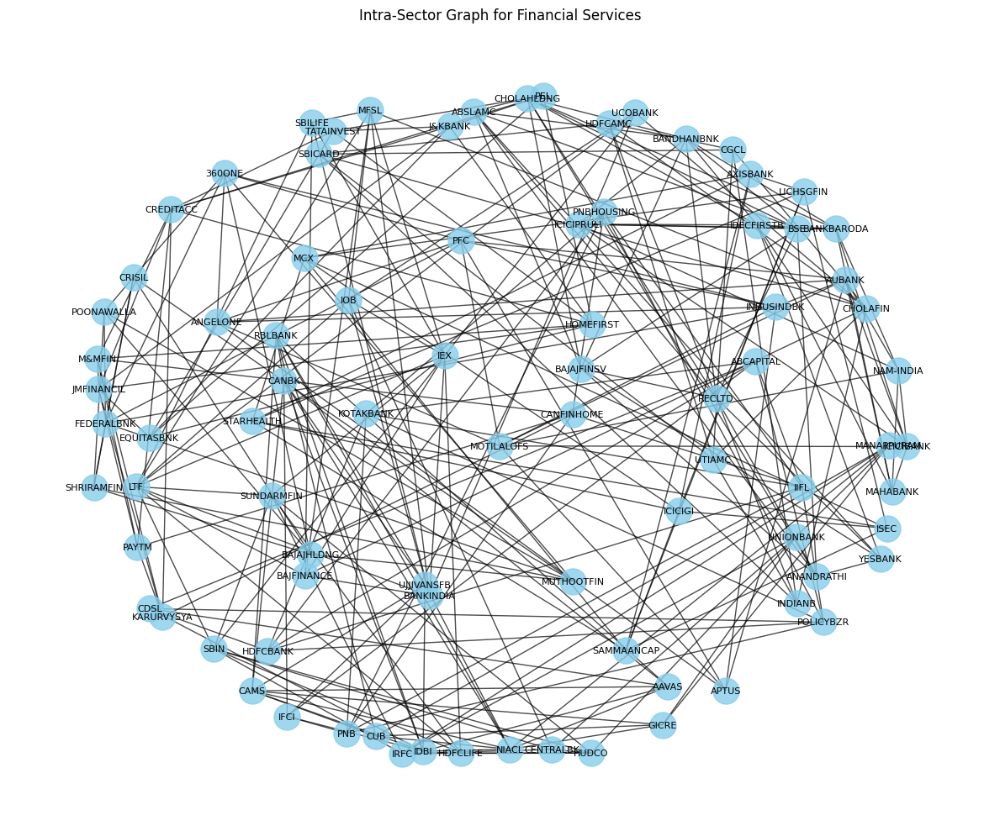

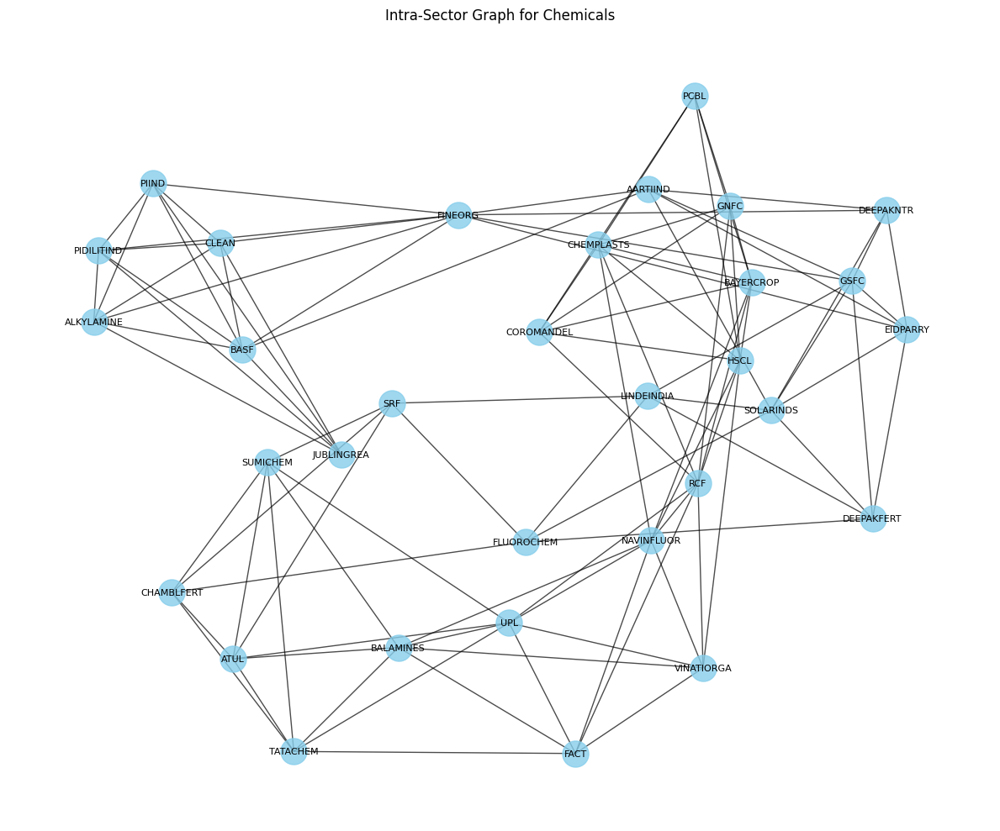

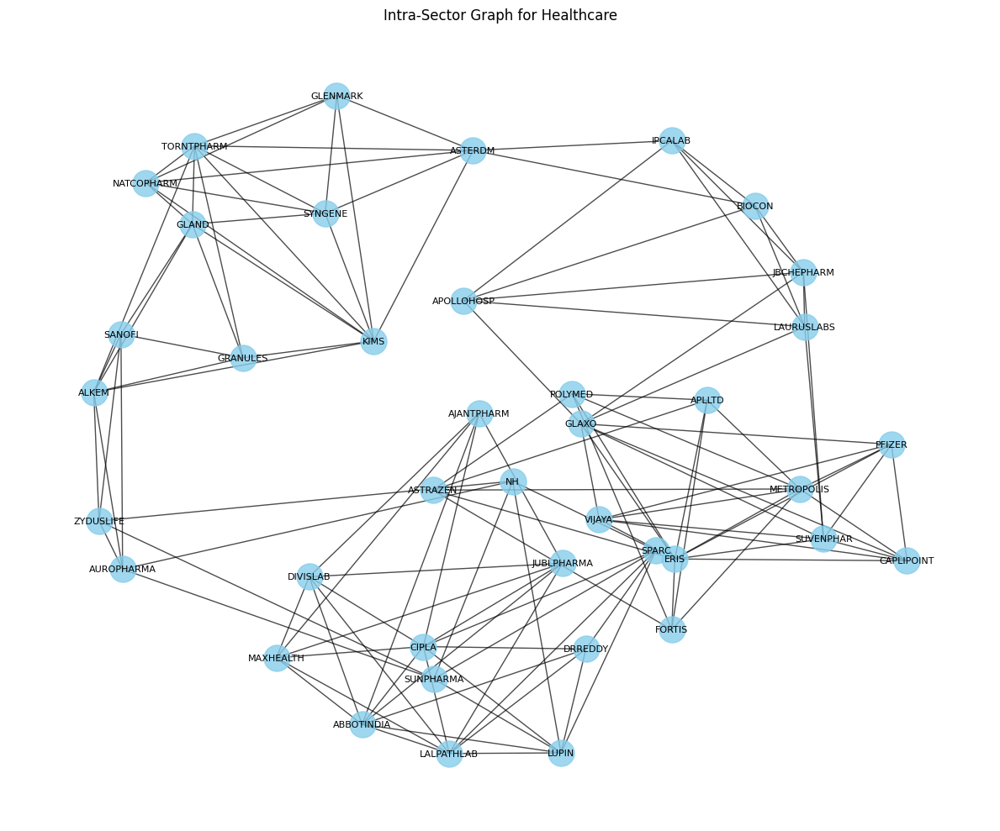

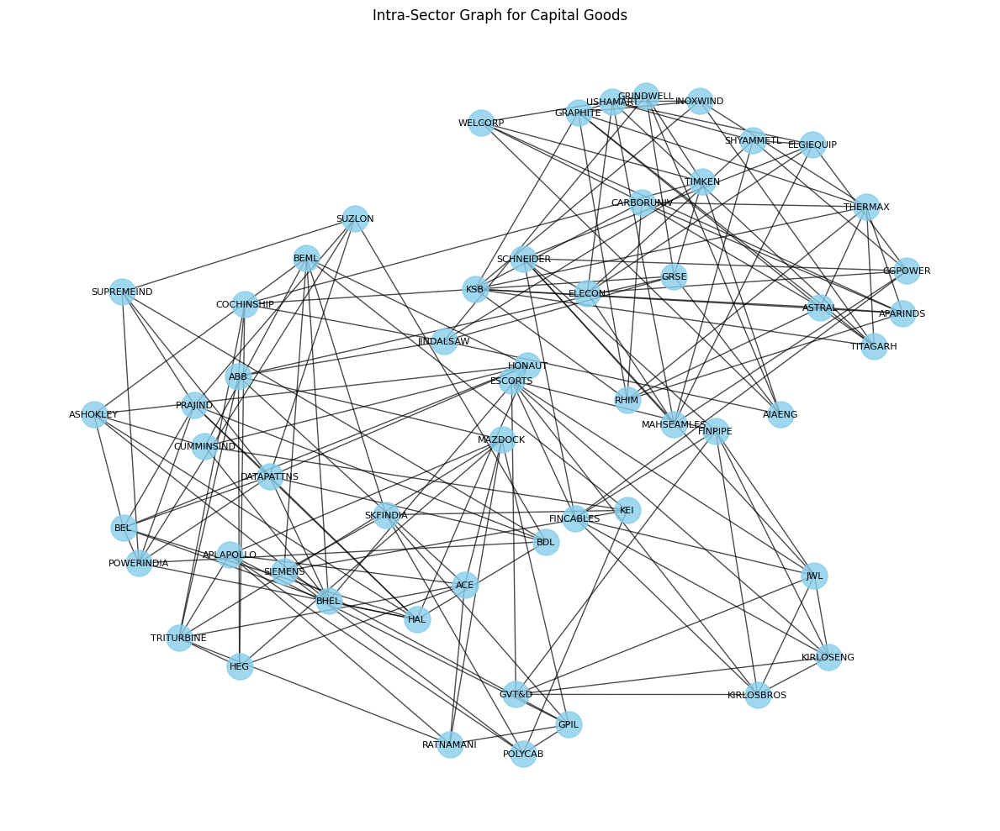

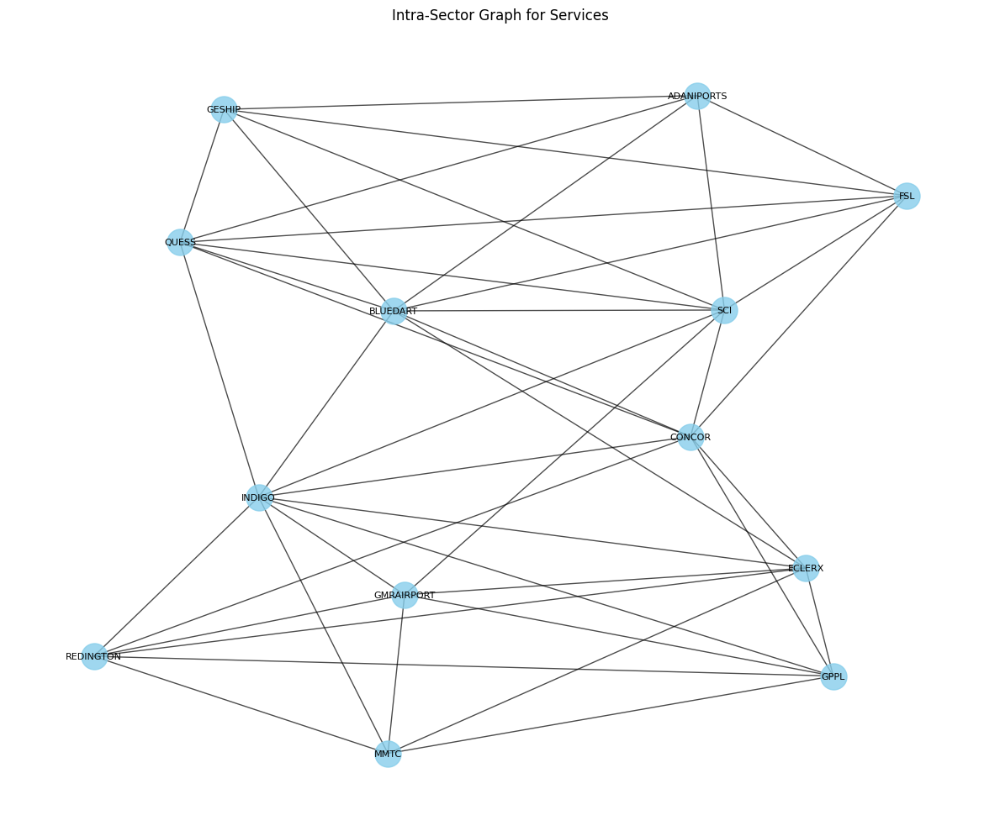

...

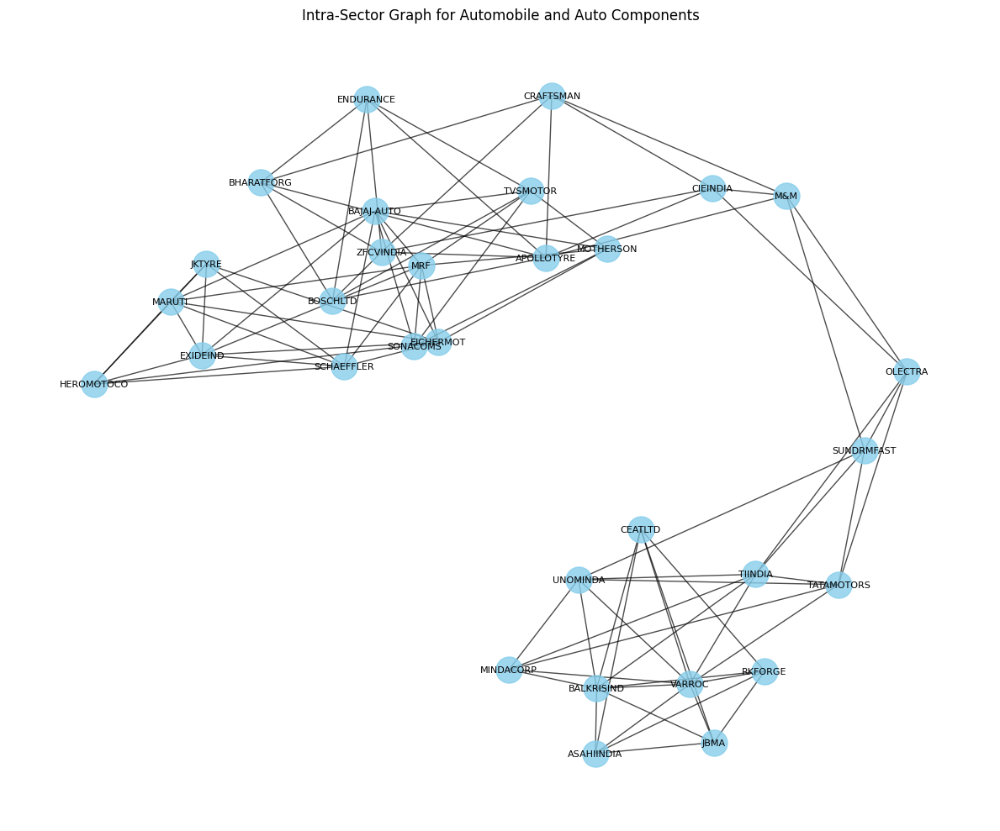

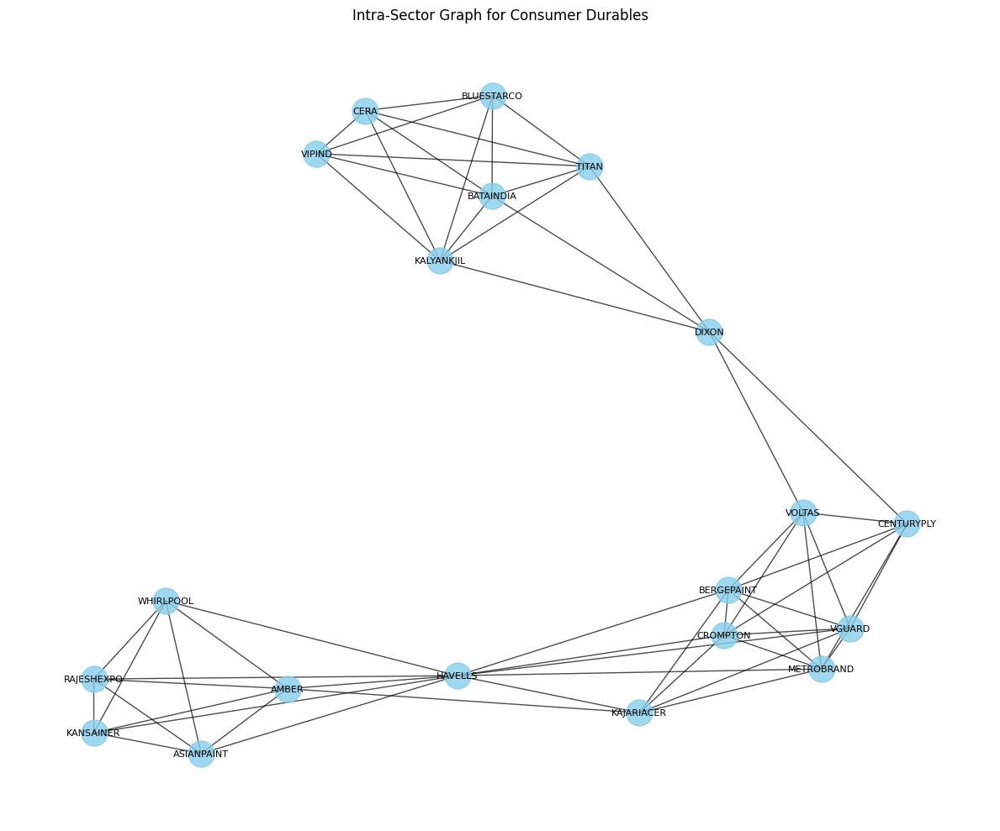

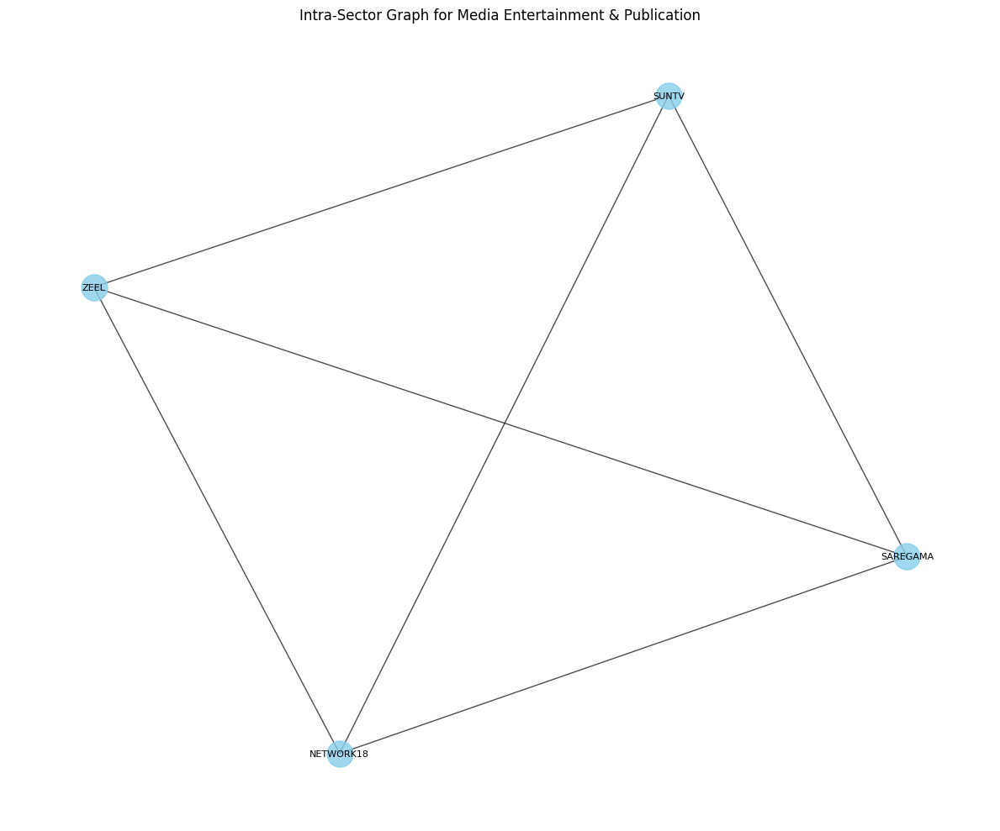

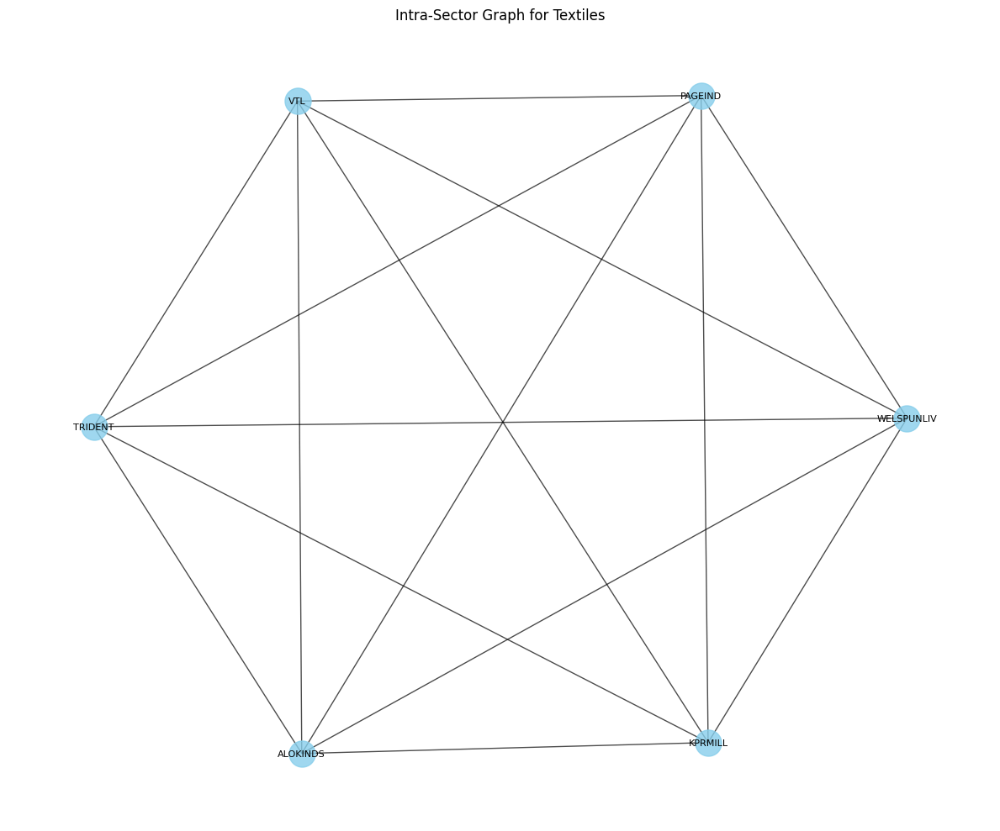

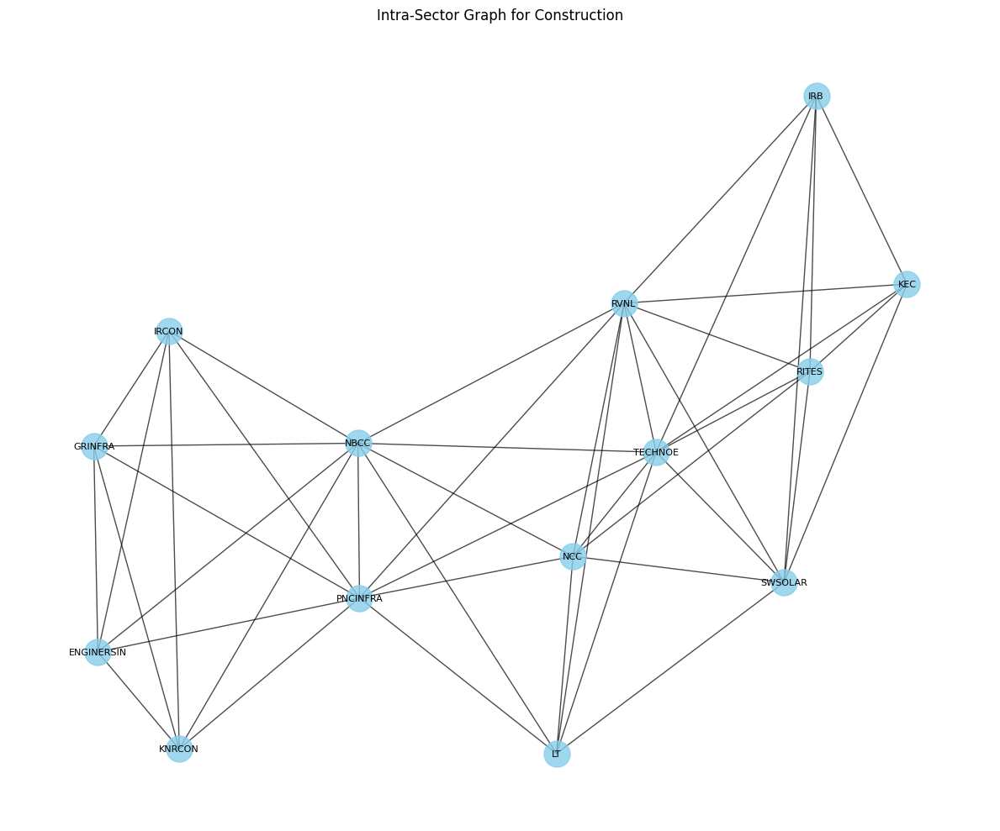

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

def plot_intra_sector_graph(G, sector_attr='sector', figsize=(12, 10)):
    # Get unique sectors and assign colors
    sectors = {n: G.nodes[n][sector_attr] for n in G.nodes()}
    unique_sectors = sorted(set(sectors.values()))
    plt.figure(figsize=figsize)
    pos = nx.spring_layout(G, k=0.3*len(G)**0.5,
                         weight='weight',
                         iterations=100,
                         seed=42)
    # Draw edges first (behind nodes)
    nx.draw_networkx_edges(G, pos,
                          alpha=0.7,
                          edge_color='black',
                          width=1)
    # Draw nodes with sector colors
    for sector in unique_sectors:
        nodes = [n for n in G.nodes() if sectors[n] == sector]
        nx.draw_networkx_nodes(G, pos,
                              nodelist=nodes,
                              node_color='skyblue',
                              node_size=500,
                              alpha=0.8)
    # Draw node labels
    nx.draw_networkx_labels(G, pos,
                           font_size=8,
                           font_color='black')

    plt.title(f"Intra-Sector Graph for {sector}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Usage
for sector, G in intra_sector_graphs.items():
    plot_intra_sector_graph(G)

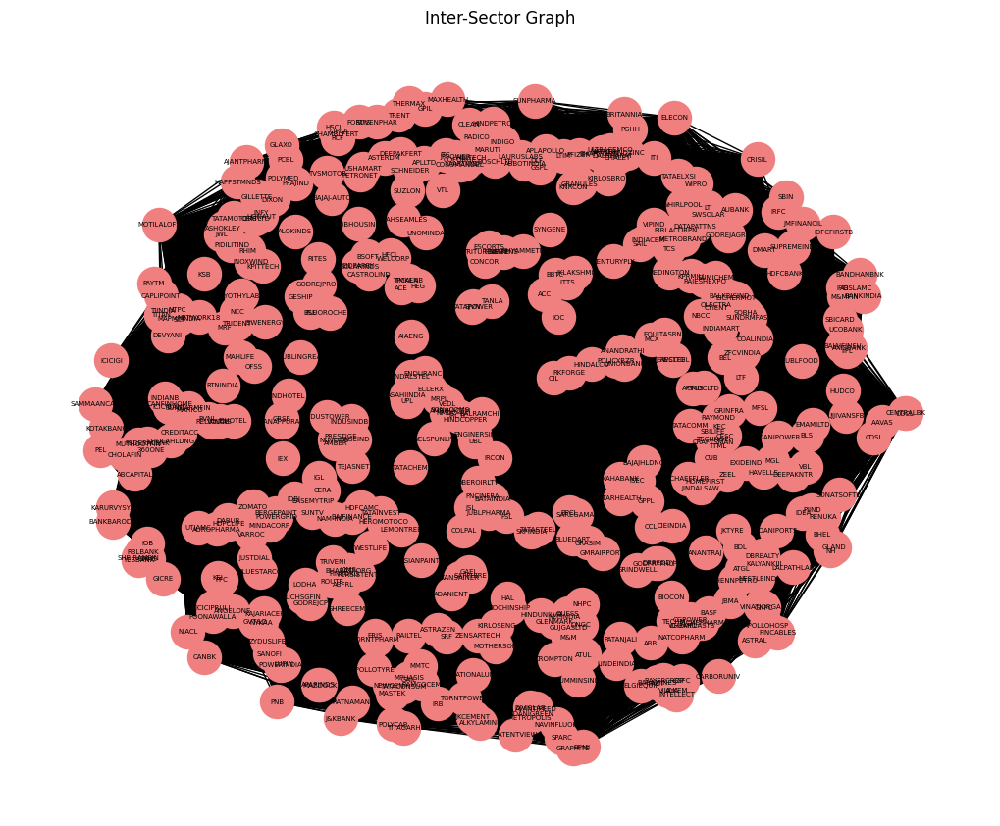

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Visualize inter-sector graph
plt.figure(figsize=(10, 8))
nx.draw(inter_sector_graph, with_labels=True, node_color='lightcoral', node_size=600, font_size=5)
plt.title("Inter-Sector Graph")
plt.show()


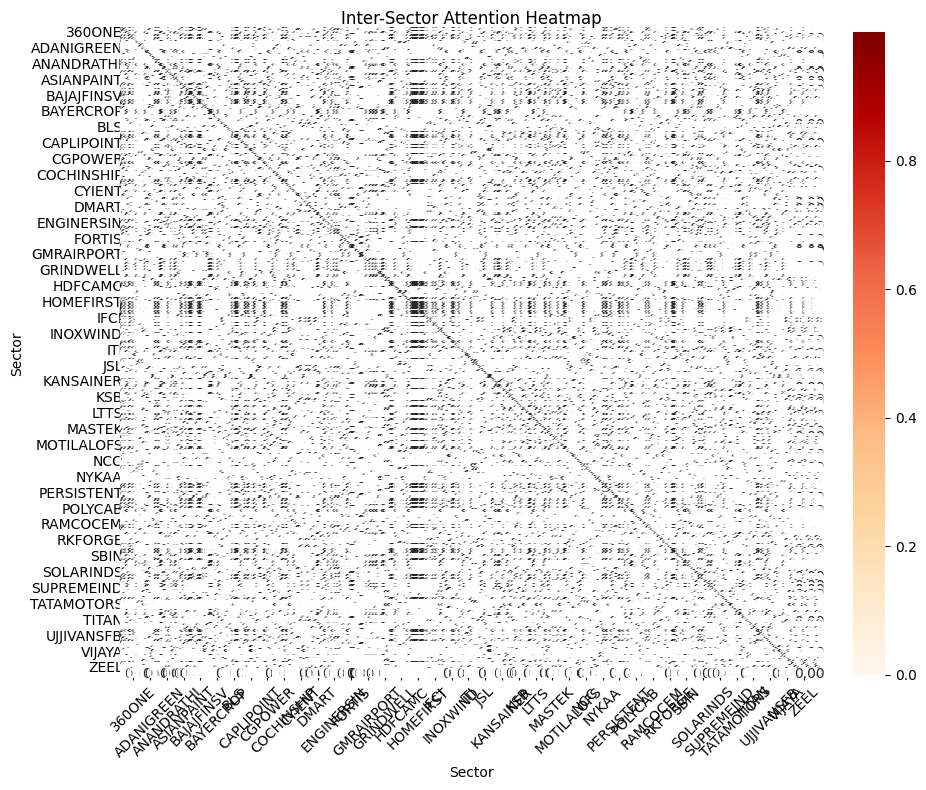

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

def plot_inter_sector_heatmap(G, figsize=(10, 8)):
    # Get sorted list of sector nodes
    sectors = sorted(G.nodes())

    # Initialize empty DataFrame for attention matrix
    matrix = pd.DataFrame(0, index=sectors, columns=sectors, dtype=float)

    for u, v, data in G.edges(data=True):
        weight = data.get('weight', 0)
        matrix.loc[u, v] = weight
        matrix.loc[v, u] = weight  # symmetric attention

    plt.figure(figsize=figsize)
    sns.heatmap(matrix, cmap='OrRd', annot=True, fmt=".2f", linewidths=0.5)
    plt.title("Inter-Sector Attention Heatmap")
    plt.xlabel("Sector")
    plt.ylabel("Sector")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
plot_inter_sector_heatmap(inter_sector_graph)

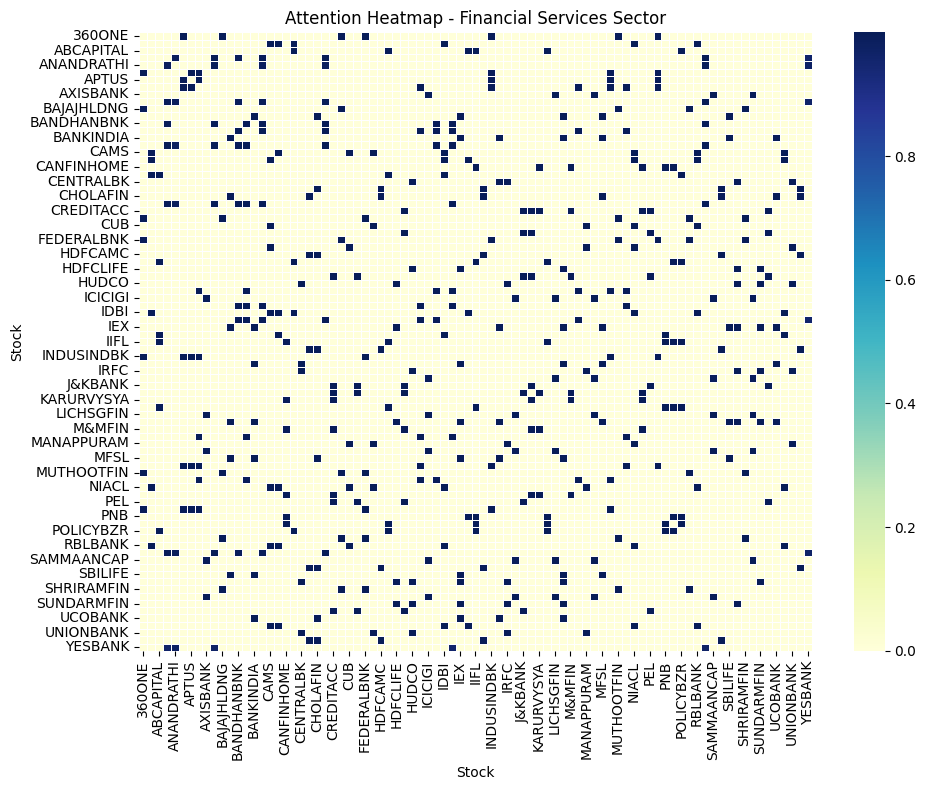

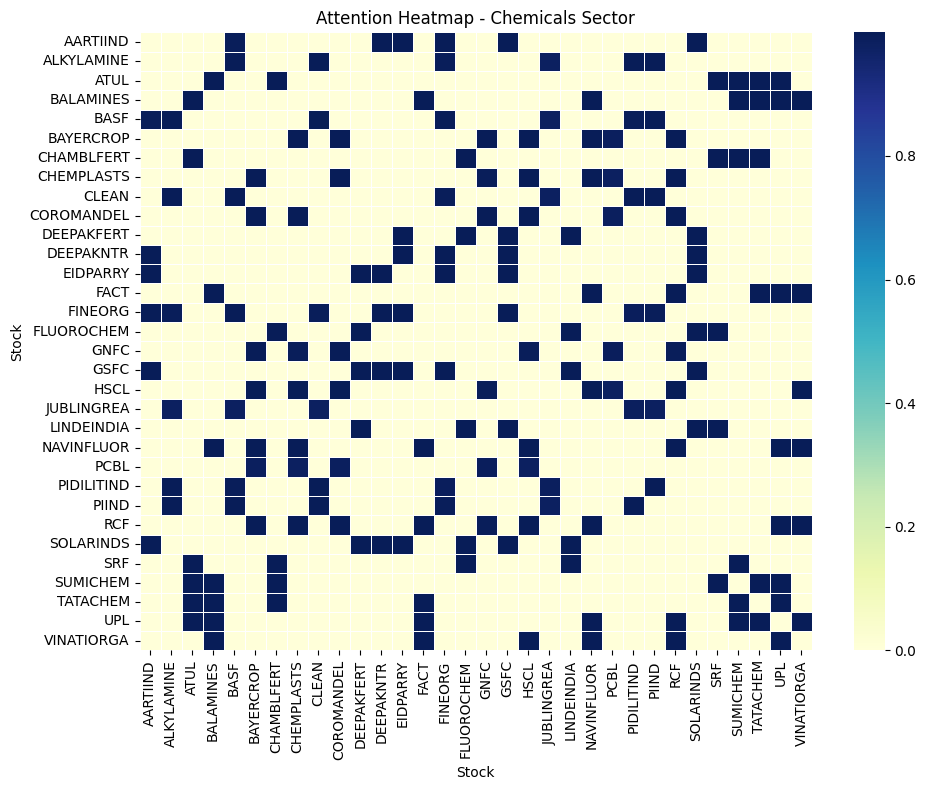

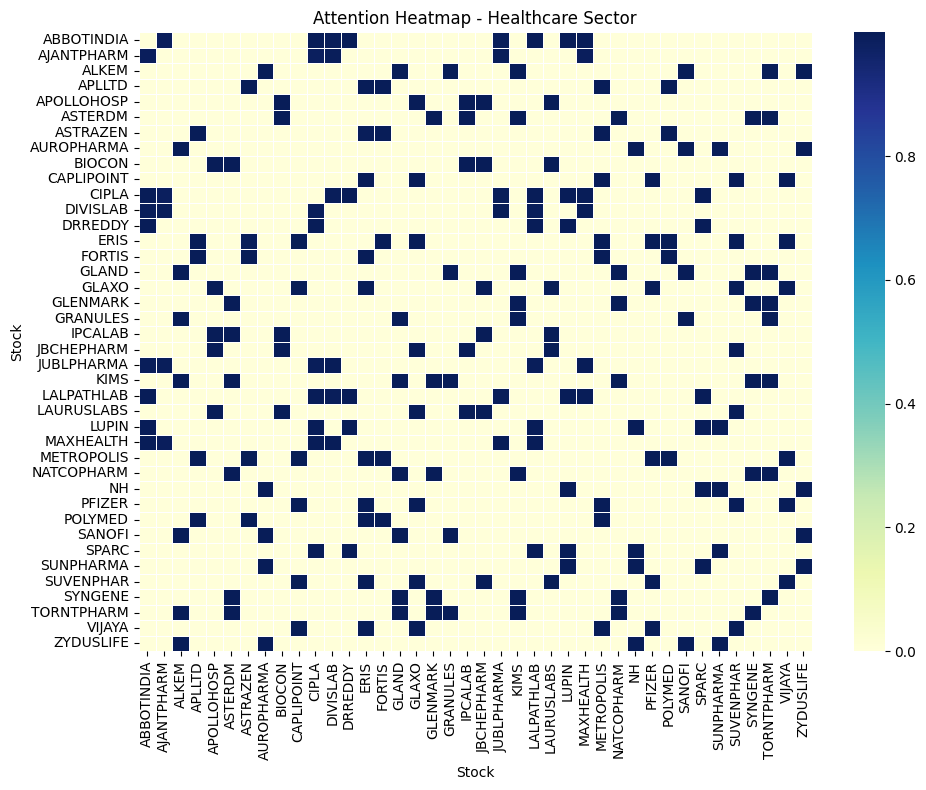

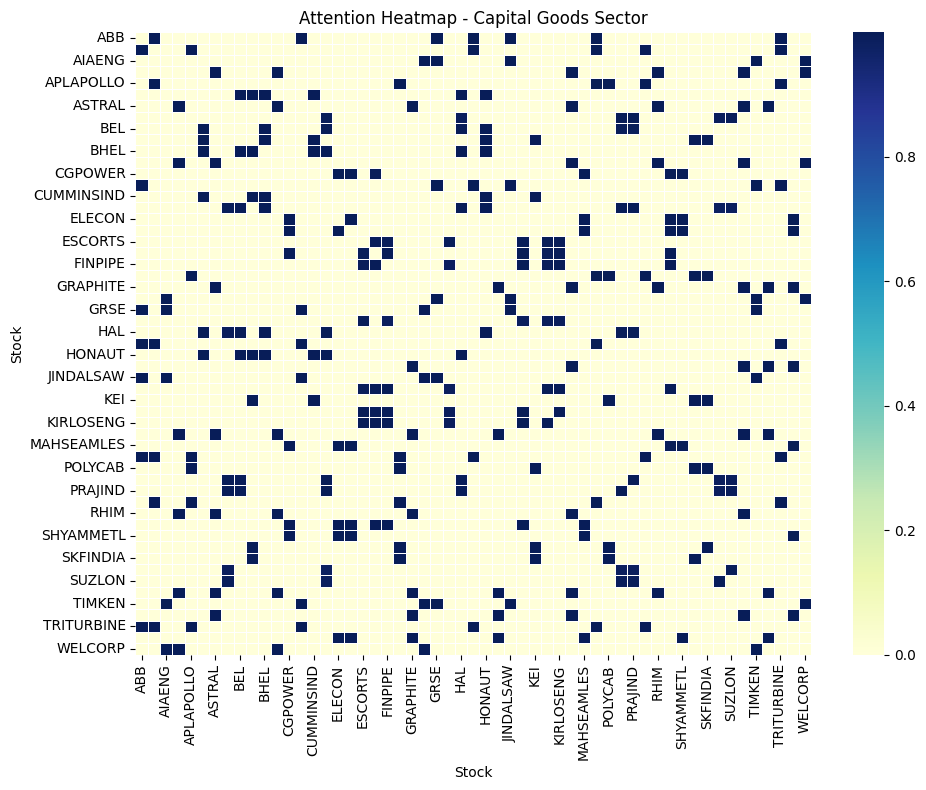

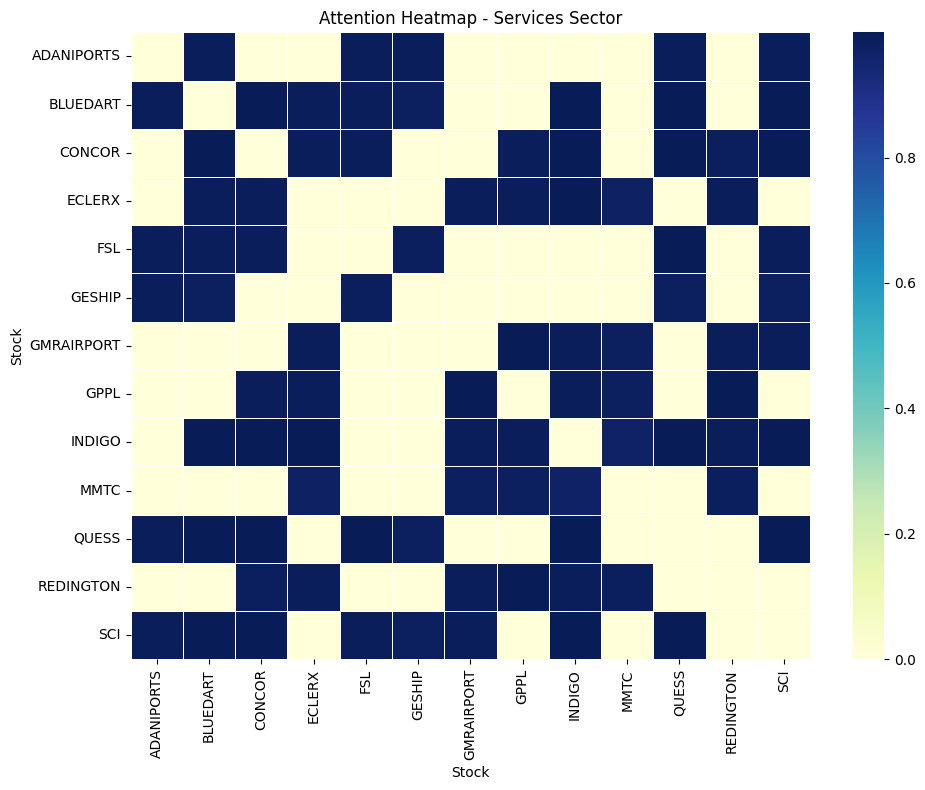

...

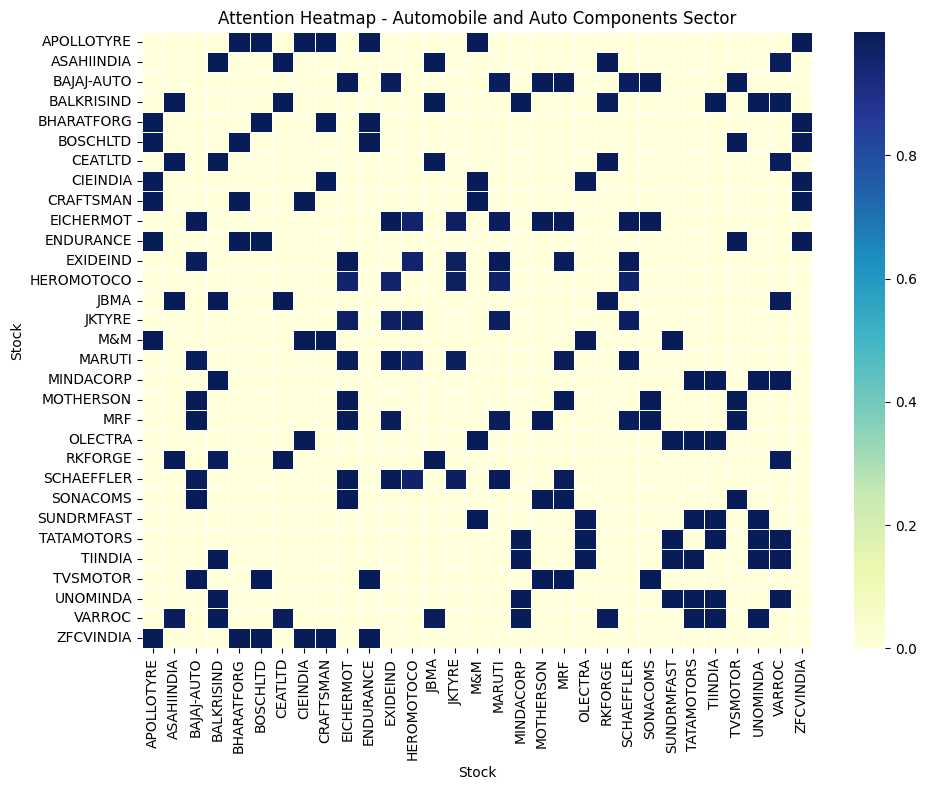

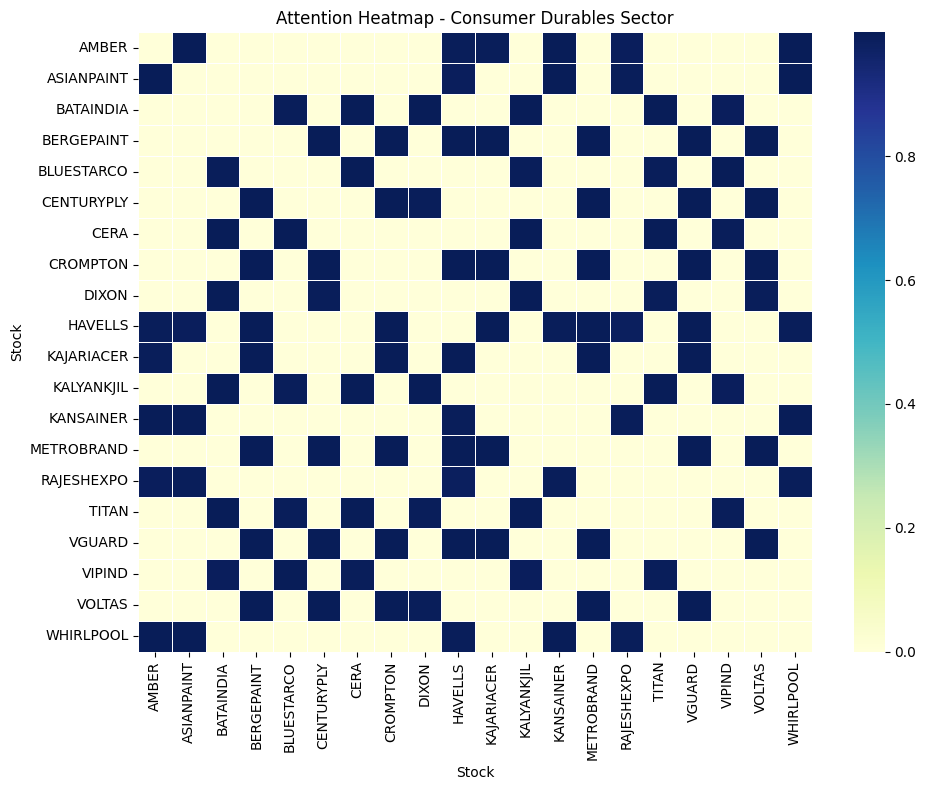

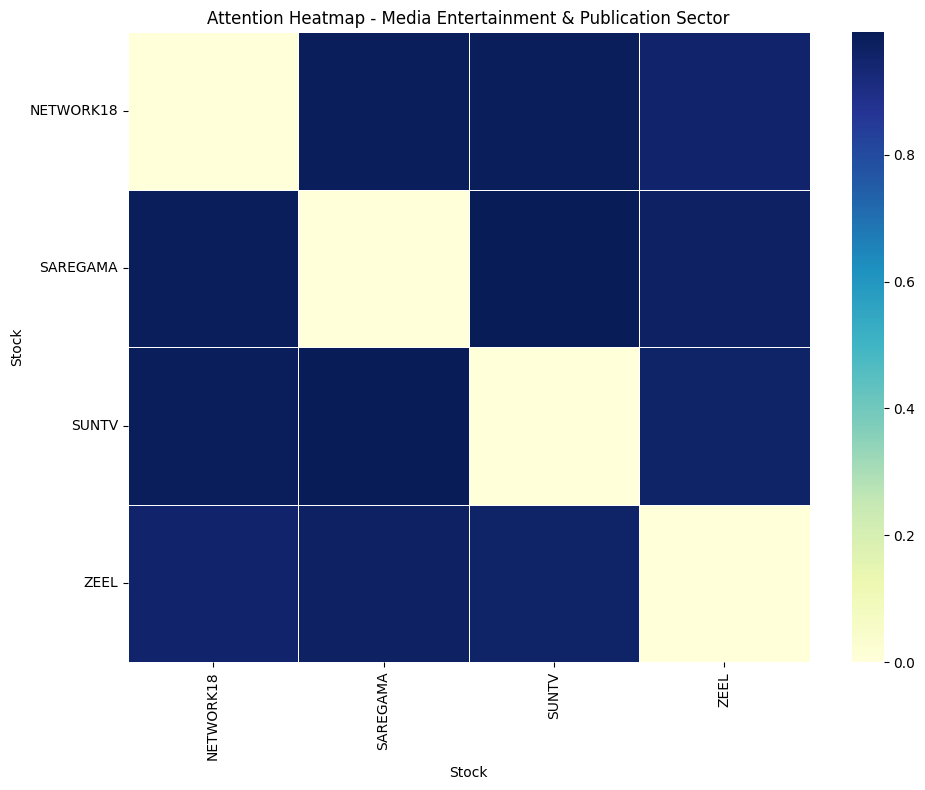

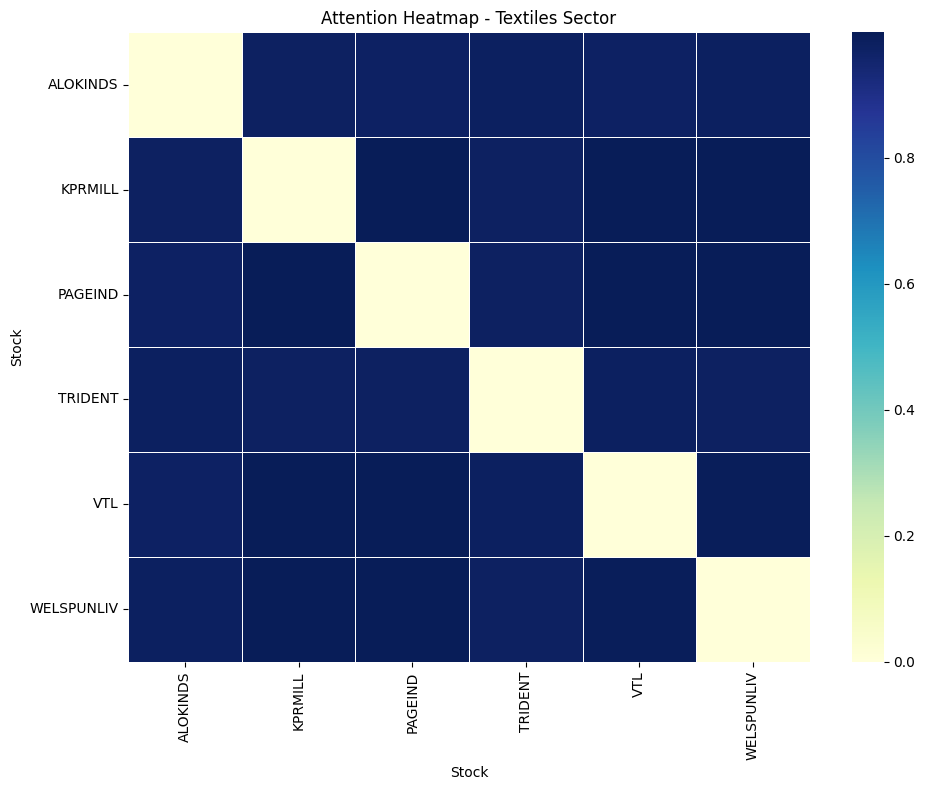

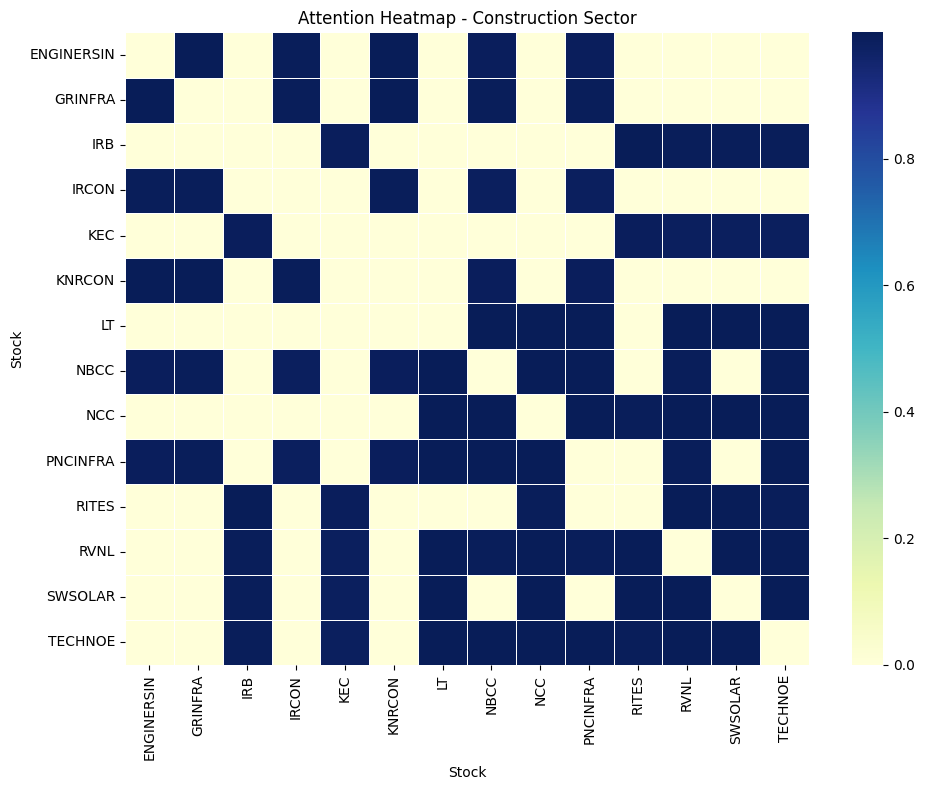

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

def plot_intra_sector_heatmap(G, sector_name, figsize=(10, 8)):
    # Extract node list
    nodes = sorted(G.nodes())

    # Create an attention matrix
    matrix = pd.DataFrame(0, index=nodes, columns=nodes, dtype=float)

    for u, v, data in G.edges(data=True):
        weight = data.get('weight', 0)
        matrix.loc[u, v] = weight
        matrix.loc[v, u] = weight  # assuming undirected attention

    plt.figure(figsize=figsize)
    sns.heatmap(matrix, cmap='YlGnBu', annot=False, linewidths=0.5)
    plt.title(f"Attention Heatmap - {sector_name} Sector")
    plt.xlabel("Stock")
    plt.ylabel("Stock")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
# Usage
for sector, G in intra_sector_graphs.items():
    plot_intra_sector_heatmap(G, sector_name=sector)


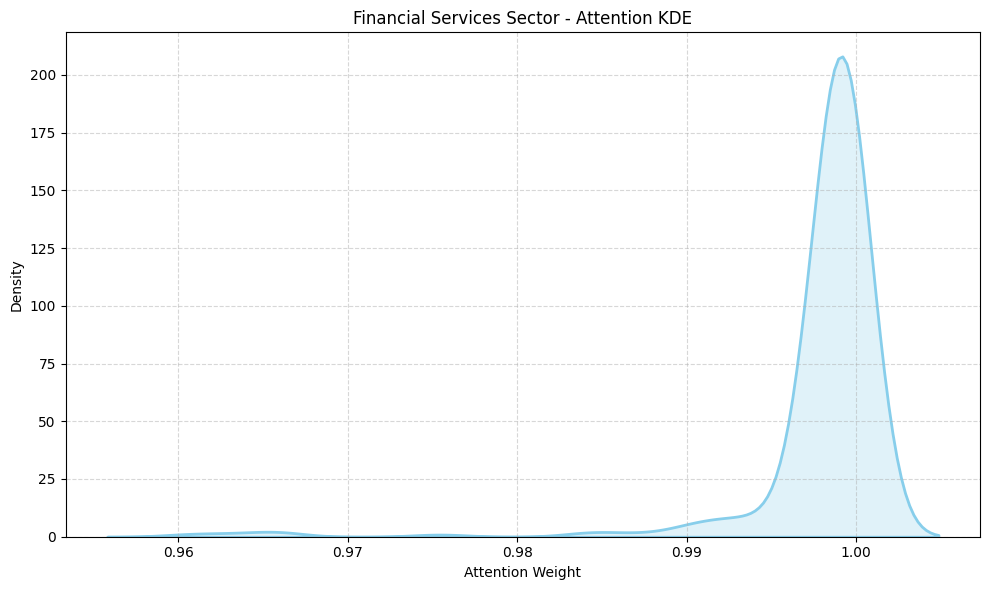

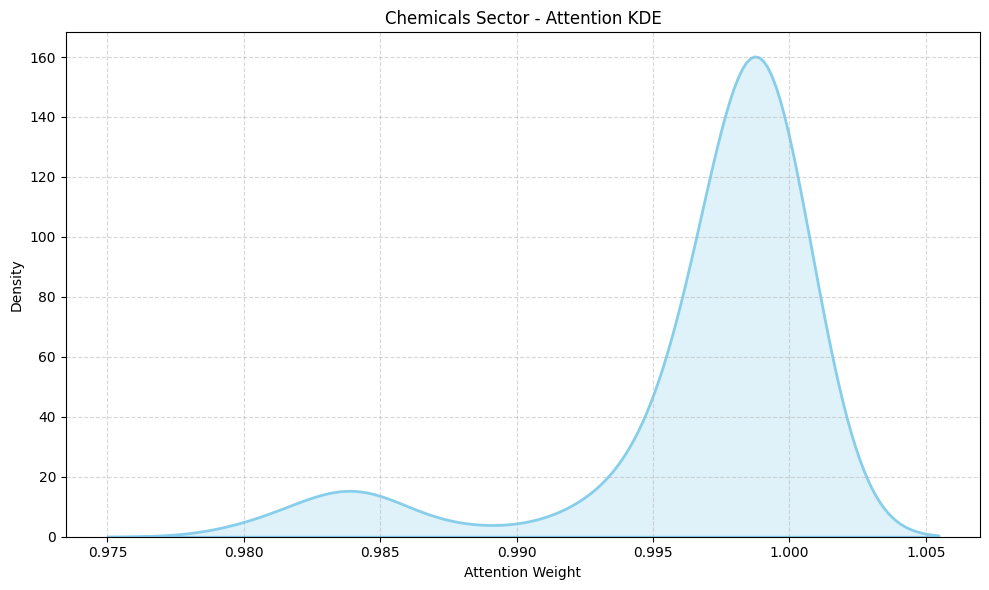

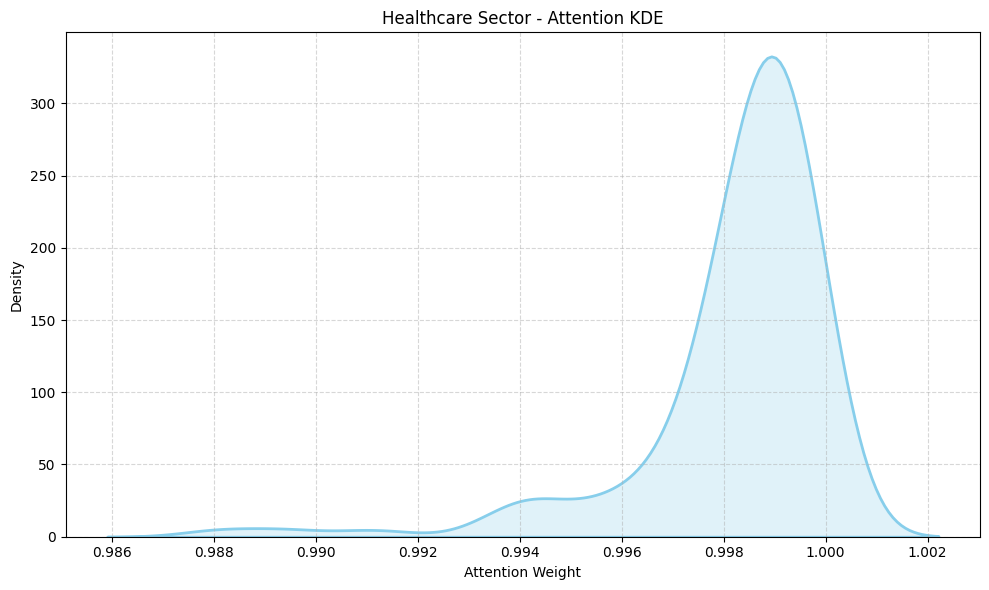

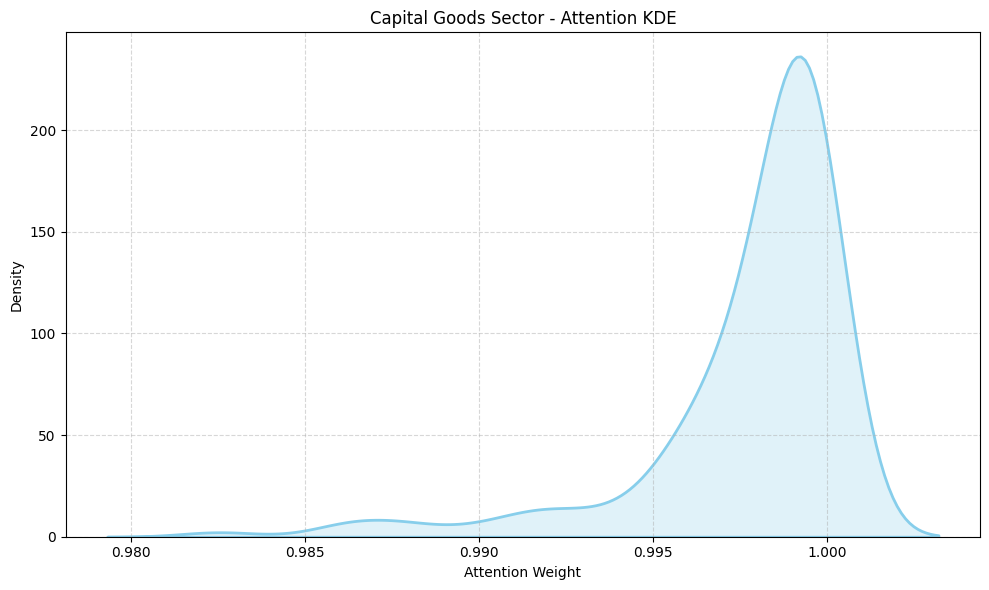

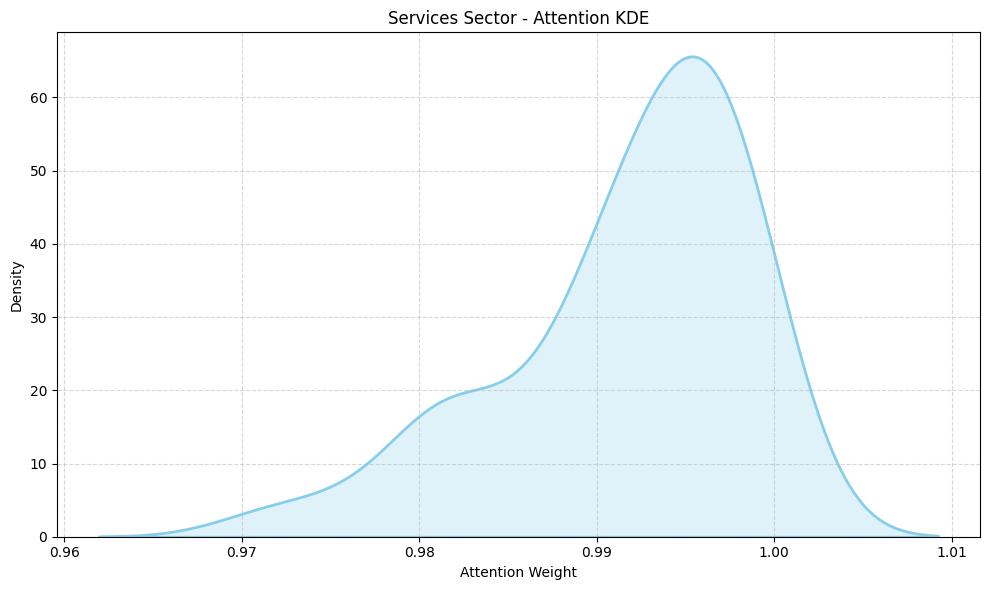

...

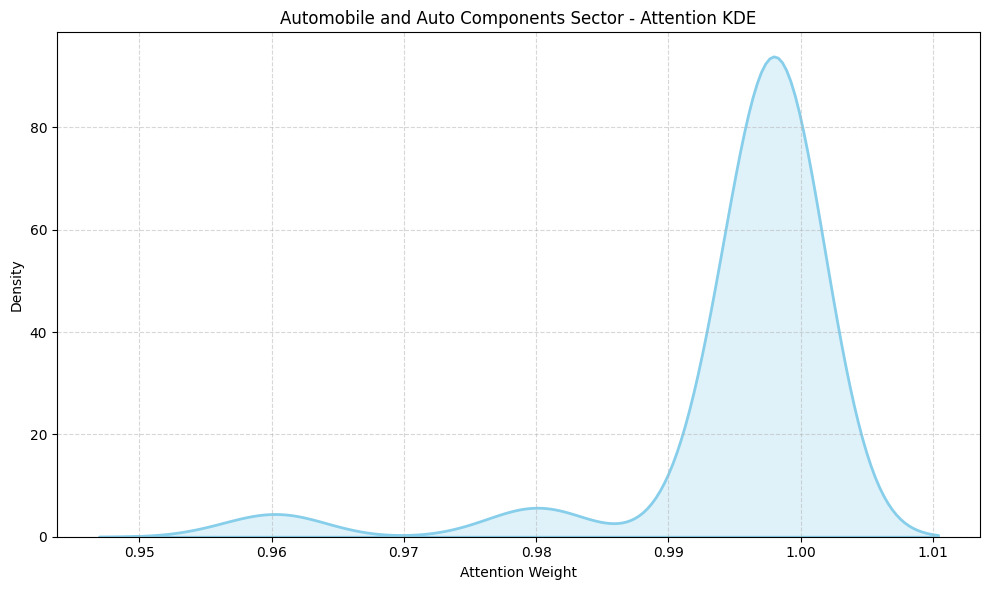

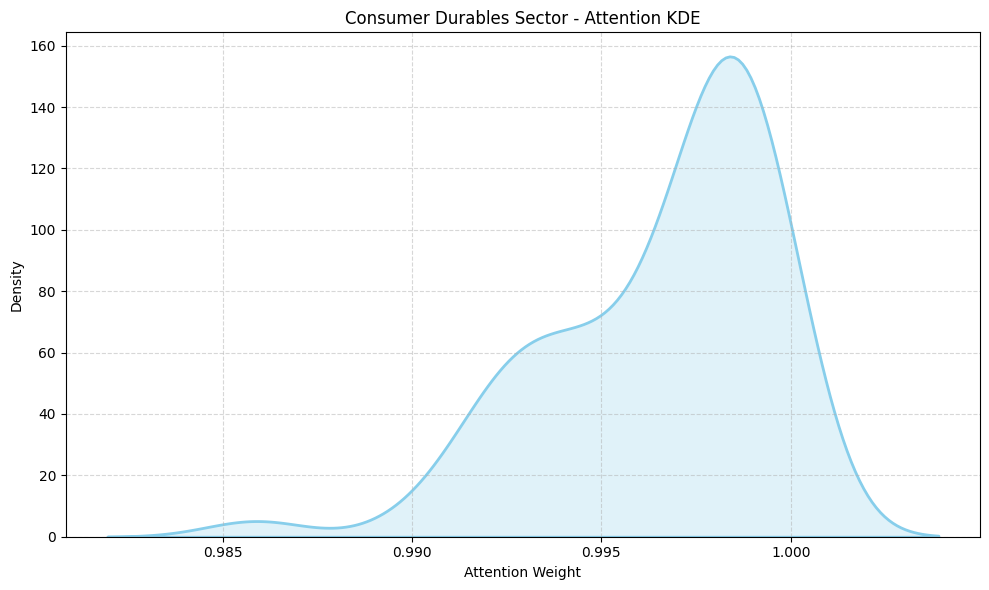

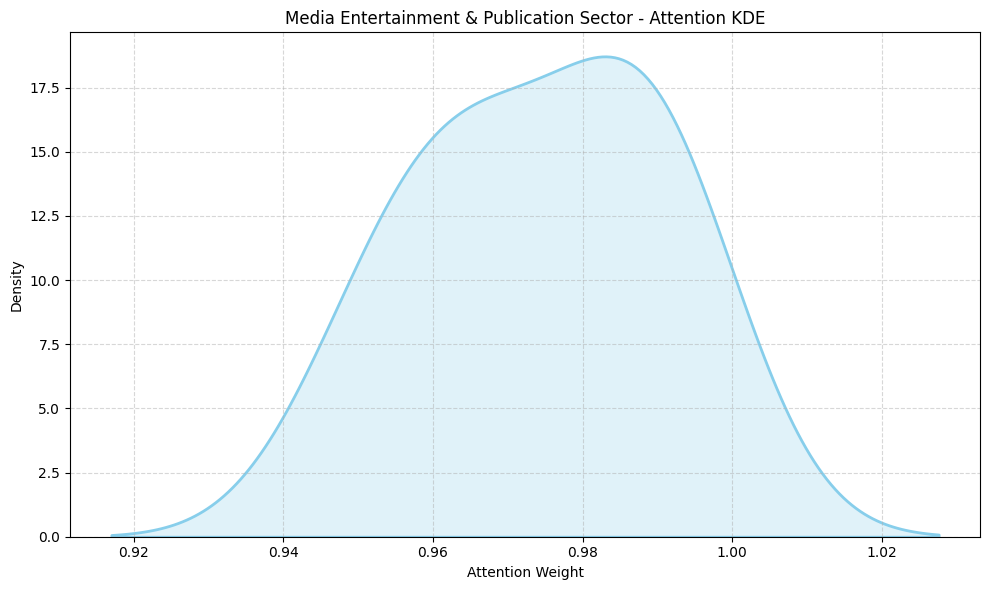

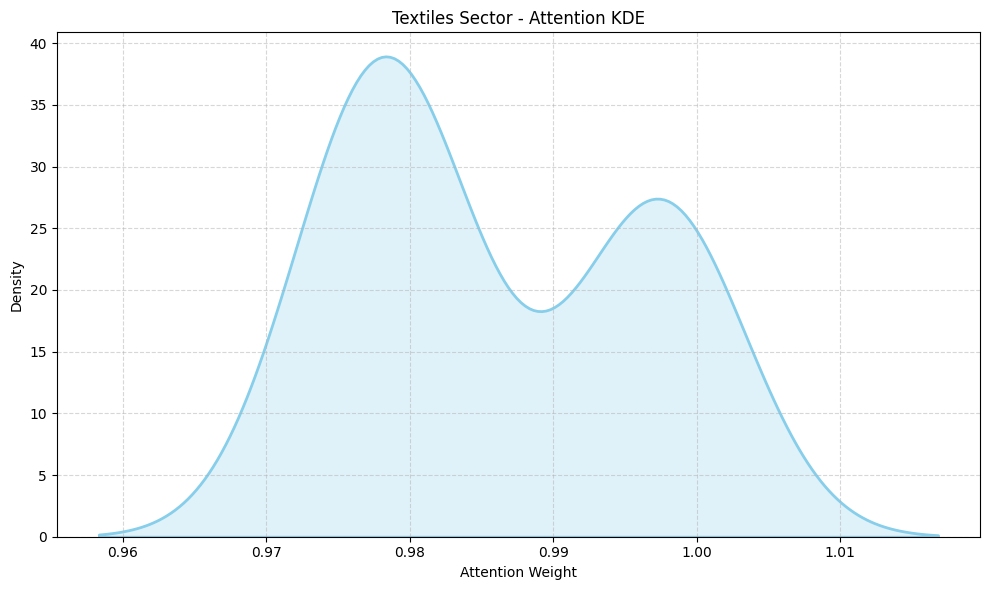

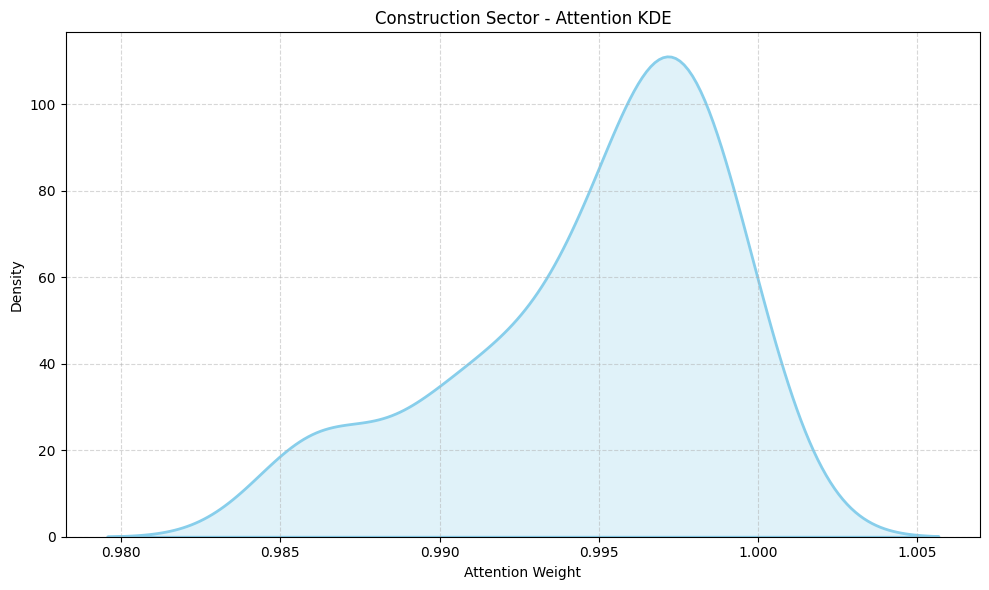

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_attention_kde(G, title="Attention Weight Distribution"):
    # Extract all attention weights from the graph edges
    weights = [data.get('weight', 0) for _, _, data in G.edges(data=True)]

    if not weights:
        print("⚠️ No weights to plot.")
        return

    plt.figure(figsize=(10, 6))
    sns.kdeplot(weights, fill=True, linewidth=2, color="skyblue")
    plt.title(title)
    plt.xlabel("Attention Weight")
    plt.ylabel("Density")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

for sector, G in intra_sector_graphs.items():
  plot_attention_kde(G, title=f"{sector} Sector - Attention KDE")



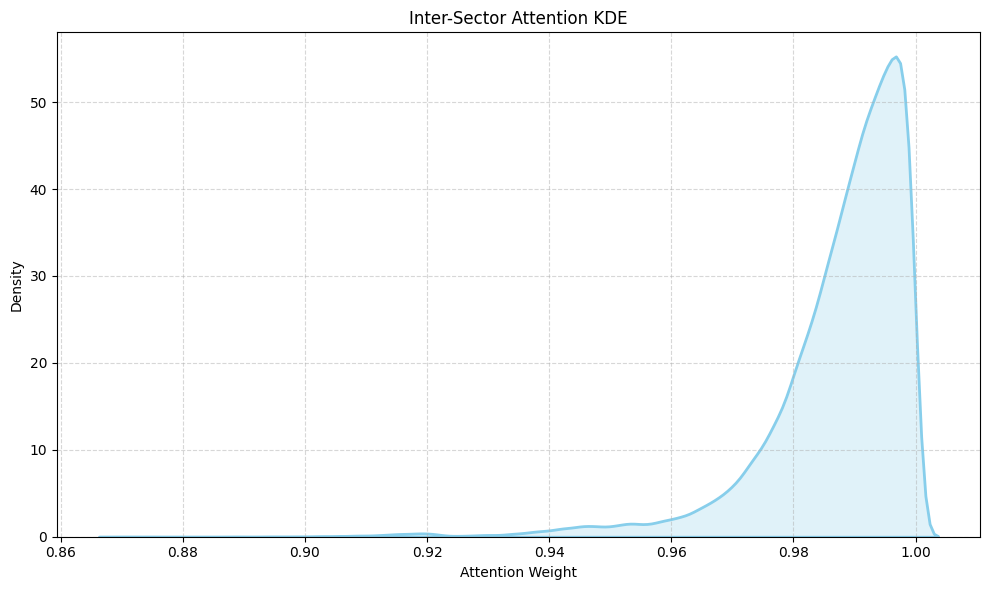

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_attention_kde(G, title="Attention Weight Distribution"):
    # Extract all attention weights from the graph edges
    weights = [data.get('weight', 0) for _, _, data in G.edges(data=True)]

    if not weights:
        print("⚠️ No weights to plot.")
        return

    plt.figure(figsize=(10, 6))
    sns.kdeplot(weights, fill=True, linewidth=2, color="skyblue")
    plt.title(title)
    plt.xlabel("Attention Weight")
    plt.ylabel("Density")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

plot_attention_kde(inter_sector_graph, title="Inter-Sector Attention KDE")